In [420]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 

# data Visualization
import plotly.graph_objs as go
import plotly.offline as py
import matplotlib.ticker as mtick
py.init_notebook_mode(connected=True)

from sklearn import tree
from sklearn.metrics import roc_auc_score, roc_curve, auc, f1_score, precision_recall_curve,accuracy_score,recall_score,precision_score,f1_score
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression, Lasso, Ridge, BayesianRidge, ElasticNet, HuberRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
#sklearn Processing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder,StandardScaler

from sklearn.metrics import confusion_matrix,classification_report

#feature select
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.ensemble import ExtraTreesClassifier

# untuk hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV,cross_val_score
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv("finpro.csv") 
df 

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [3]:
df.drop("customerID",axis=1,inplace=True)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


In [5]:
df.isna().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [6]:
df.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

 ### Convert TotalCharges to numeric

In [7]:
#Identifying the rows containing missing data
missing_value_row = list(df[df['TotalCharges'] == " "].index)
print('Missing Value Rows-->', missing_value_row , '\nTotal rows-->', len(missing_value_row))

Missing Value Rows--> [488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754] 
Total rows--> 11


In [8]:
# Replacing the spaces with 0
for missing_row in missing_value_row :
    df['TotalCharges'][missing_row] = 0

In [9]:
df['TotalChargesNum']= pd.to_numeric(df['TotalCharges'])


In [10]:
df.drop("TotalCharges",axis=1,inplace=True)

In [11]:
df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,Churn,TotalChargesNum
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,No,29.85
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,No,1889.50
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,Yes,108.15
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,No,1840.75
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,Yes,151.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,No,1990.50
7039,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,No,7362.90
7040,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,No,346.45
7041,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,Yes,306.60


## UNIQUE VALUE COLUMNS

In [12]:
def unik(columnname):
    print(columnname,":" ,df[columnname].unique())
for i in range(1,len(df.columns)):
    unik(df.columns[i])

SeniorCitizen : [0 1]
Partner : ['Yes' 'No']
Dependents : ['No' 'Yes']
tenure : [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
PhoneService : ['No' 'Yes']
MultipleLines : ['No phone service' 'No' 'Yes']
InternetService : ['DSL' 'Fiber optic' 'No']
OnlineSecurity : ['No' 'Yes' 'No internet service']
OnlineBackup : ['Yes' 'No' 'No internet service']
DeviceProtection : ['No' 'Yes' 'No internet service']
TechSupport : ['No' 'Yes' 'No internet service']
StreamingTV : ['No' 'Yes' 'No internet service']
StreamingMovies : ['No' 'Yes' 'No internet service']
Contract : ['Month-to-month' 'One year' 'Two year']
PaperlessBilling : ['Yes' 'No']
PaymentMethod : ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
MonthlyCharges : [29.85 56.95 53.85 ... 63.1  44.2  78.7 ]
Churn : ['No' 'Yes

- customerID : Customer ID
- gender : Whether the customer is a male or a female
- SeniorCitizen : Whether the customer is a senior citizen or not (1, 0)
- Partner : Whether the customer has a partner or not (Yes, No)
- Dependents : Whether the customer has dependents or not (Yes, No)
- tenure : Number of months the customer has stayed with the company
- PhoneService : Whether the customer has a phone service or not (Yes, No)
- MultipleLines : Whether the customer has multiple lines or not (Yes, No, No phone service)
- InternetService : Customer’s internet service provider (DSL, Fiber optic, No)
- OnlineSecurity : Whether the customer has online security or not (Yes, No, No internet service)
- OnlineBackup : Whether the customer has online backup or not (Yes, No, No internet service)
- DeviceProtection : Whether the customer has device protection or not (Yes, No, No internet service)
- TechSupport : Whether the customer has tech support or not (Yes, No, No internet service)
- StreamingTV : Whether the customer has streaming TV or not (Yes, No, No internet service)
- StreamingMovies : Whether the customer has streaming movies or not (Yes, No, No internet service)
- Contract : The contract term of the customer (Month-to-month, One year, Two year)
- PaperlessBilling : Whether the customer has paperless billing or not (Yes, No)
- PaymentMethod : The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
- MonthlyCharges : The amount charged to the customer monthly
- TotalCharges : The total amount charged to the customer
- Churn : Whether the customer churned or not (Yes or No)

# CHURN VALUE COUNT

In [13]:
churn = df[(df["Churn"] != 0)]
no_churn = df[(df["Churn"] == 0)]

trace = go.Bar(
        x = (df["Churn"].value_counts().values.tolist()), 
        y = ["Churn : no", "Churn : yes"], 
        orientation = "h", opacity = 0.8, 
        text=df["Churn"].value_counts().values.tolist(), 
        textfont=dict(size=15),
        textposition = "auto",
        marker=dict(
        color=["blue","green"],
        line=dict(color='#000000',width=1.5)
        ))

layout = dict(title = 'Count of Churn variable',autosize = False,height  = 500,width   = 800)
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

## Distribution on Percent Churn

In [14]:

trace = go.Pie(labels = ['Churn : no', 'Churn : yes'], values = df['Churn'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors=['blue','green'], 
                           line=dict(color='#000000', width=1.5)))


layout = dict(title =  'Distribution on percent count Churn',
                        autosize = False,
                        height  = 500,
                        width   = 800)
           
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

# __FEATURE DISTIBUTION__  

# * GENDER *

In [15]:
df["gender"].unique()

array(['Female', 'Male'], dtype=object)

In [16]:
df["gender"].value_counts()

Male      3555
Female    3488
Name: gender, dtype: int64

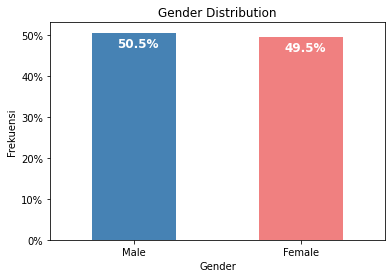

In [17]:
colour = ["steelblue","lightcoral"]
ax = (df['gender'].value_counts()*100.0 /len(df)).plot(kind='bar',stacked = True,rot = 0,color = colour)
                                                                          
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel("Frekuensi")
ax.set_xlabel("Gender")
ax.set_title("Gender Distribution")

totals = []
for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-3.5, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
           weight = 'bold')

### Distribution of Gender based on Churn

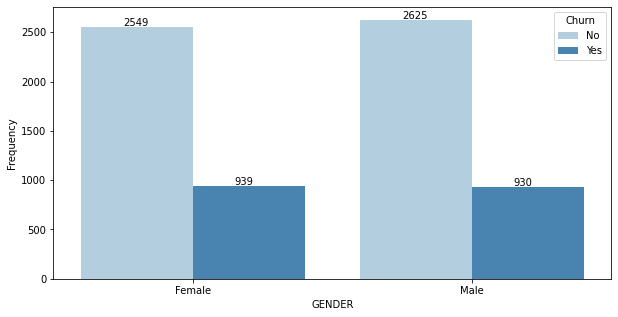

In [18]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["gender"], hue = df["Churn"], palette = "Blues")
plt.xlabel('GENDER')
plt.ylabel('Frequency')
for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+15),fontsize=10)
plt.show()

### Percentage Gender on Churn

In [19]:
listItem = []
for col in df["gender"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["gender"]==col)]["Churn"].count() / df[df["gender"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["gender"]==col)]["Churn"].count() / df[df["gender"]==col]["Churn"].count() * 100)
                    ])
    
dfGender = pd.DataFrame(listItem, columns='Gender,Churn,No Churn'.split(','))
dfGender

,Gender,Churn,No Churn
0,Female,26.920872,73.079128
1,Male,26.160338,73.839662


# * SENIOR CITIZEN *

In [20]:
df["SeniorCitizen"].unique()

array([0, 1])

In [21]:
df["SeniorCitizen"].value_counts()

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

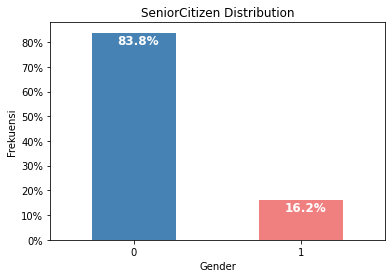

In [22]:
colour = ["steelblue","lightcoral"]
ax = (df["SeniorCitizen"].value_counts()*100.0 /len(df)).plot(kind='bar',stacked = True,rot = 0,color = colour)
                                                                          
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel("Frekuensi")
ax.set_xlabel("Gender")
ax.set_title("SeniorCitizen Distribution")

totals = []
for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-4.5, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
           weight = 'bold')

### Distribution of SeniorCitizen based on Churn

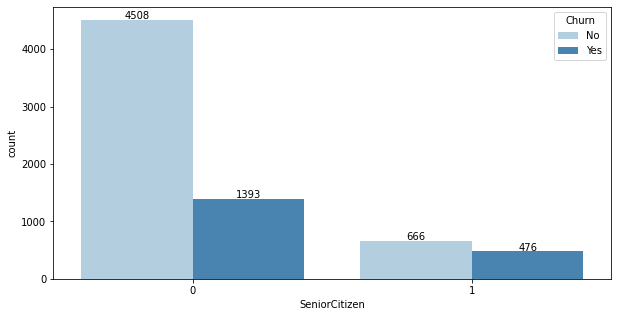

In [23]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["SeniorCitizen"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()


### Percentage SeniorCitizen on Churn

In [24]:
listItem = []
for col in df["SeniorCitizen"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["SeniorCitizen"]==col)]["Churn"].count() / df[df["SeniorCitizen"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["SeniorCitizen"]==col)]["Churn"].count() / df[df["SeniorCitizen"]==col]["Churn"].count() * 100)
                    ])
    
dfSeniorCitizen = pd.DataFrame(listItem, columns='SeniorCitizen,Churn,No Churn'.split(','))
dfSeniorCitizen

,SeniorCitizen,Churn,No Churn
0,0,23.606168,76.393832
1,1,41.681261,58.318739


# * PARTNER *

In [25]:
df["Partner"].value_counts()

No     3641
Yes    3402
Name: Partner, dtype: int64

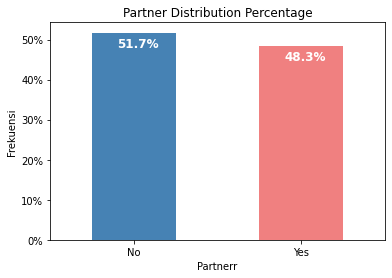

In [26]:
colour = ["steelblue","lightcoral"]
ax = (df["Partner"].value_counts()*100.0 /len(df)).plot(kind='bar',stacked = True,rot = 0,color = colour)
                                                                          
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel("Frekuensi")
ax.set_xlabel("Partnerr")
ax.set_title("Partner Distribution Percentage")

totals = []
for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-3.5, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
           weight = 'bold')

### Distribution of Partner based on Churn

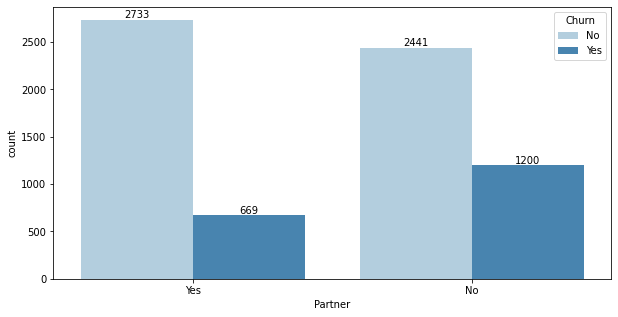

In [27]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["Partner"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Partner on Churn

In [28]:
listItem = []
for col in df["Partner"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["Partner"]==col)]["Churn"].count() / df[df["Partner"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["Partner"]==col)]["Churn"].count() / df[df["Partner"]==col]["Churn"].count() * 100)
                    ])
    
dfPartner = pd.DataFrame(listItem, columns='Partner,Churn,No Churn'.split(','))
dfPartner

,Partner,Churn,No Churn
0,Yes,19.664903,80.335097
1,No,32.957979,67.042021


# * DEPENDENTS *

In [29]:
df["Dependents"].unique()

array(['No', 'Yes'], dtype=object)

In [30]:
df["Dependents"].value_counts()

No     4933
Yes    2110
Name: Dependents, dtype: int64

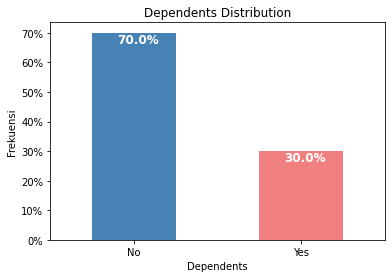

In [31]:
colour = ["steelblue","lightcoral"]
ax = (df["Dependents"].value_counts()*100.0 /len(df)).plot(kind='bar',stacked = True,rot = 0,color = colour)
                                                                          
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel("Frekuensi")
ax.set_xlabel("Dependents")
ax.set_title("Dependents Distribution")

totals = []
for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-3.5, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
           weight = 'bold')

### Distribution of Dependents based on Churn

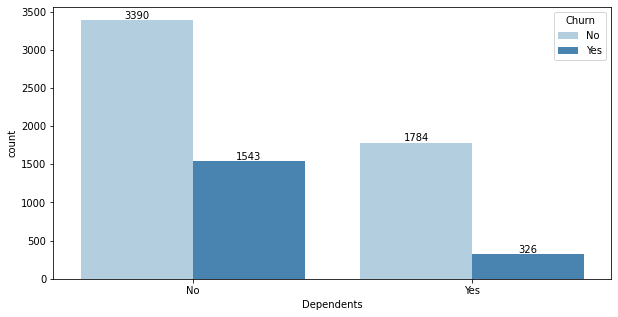

In [32]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["Dependents"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Dependents on Churn

In [33]:
listItem = []
for col in df["Dependents"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["Dependents"]==col)]["Churn"].count() / df[df["Dependents"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["Dependents"]==col)]["Churn"].count() / df[df["Dependents"]==col]["Churn"].count() * 100)
                    ])
    
dfDependents = pd.DataFrame(listItem, columns='Dependents,Churn,No Churn'.split(','))
dfDependents

,Dependents,Churn,No Churn
0,No,31.279140,68.720860
1,Yes,15.450237,84.549763


# * PhoneService *

In [34]:
df["PhoneService"].unique()

array(['No', 'Yes'], dtype=object)

In [35]:
df["PhoneService"].value_counts()

Yes    6361
No      682
Name: PhoneService, dtype: int64

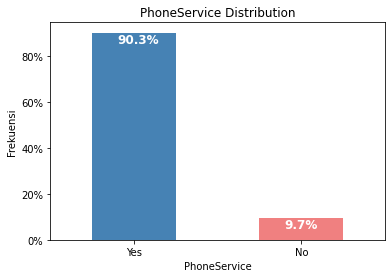

In [36]:
colour = ["steelblue","lightcoral"]
ax = (df["PhoneService"].value_counts()*100.0 /len(df)).plot(kind='bar',stacked = True,rot = 0,color = colour)
                                                                          
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel("Frekuensi")
ax.set_xlabel("PhoneService")
ax.set_title("PhoneService Distribution")

totals = []
for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-4.5, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
           weight = 'bold')

### Distribution of PhoneService based on Churn

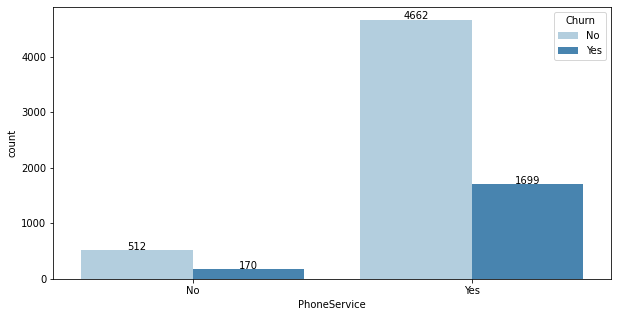

In [37]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["PhoneService"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Phone Service on Churn

In [38]:
listItem = []
for col in df["PhoneService"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["PhoneService"]==col)]["Churn"].count() / df[df["PhoneService"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["PhoneService"]==col)]["Churn"].count() / df[df["PhoneService"]==col]["Churn"].count() * 100)
                    ])
    
dfPhoneService = pd.DataFrame(listItem, columns='PhoneService,Churn,No Churn'.split(','))
dfPhoneService

,PhoneService,Churn,No Churn
0,No,24.926686,75.073314
1,Yes,26.709637,73.290363


# * MULTIPLELINES *

In [39]:
df["MultipleLines"].unique()

array(['No phone service', 'No', 'Yes'], dtype=object)

In [40]:
df["MultipleLines"].value_counts()

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64

In [41]:
df["MultipleLines"].unique()

array(['No phone service', 'No', 'Yes'], dtype=object)

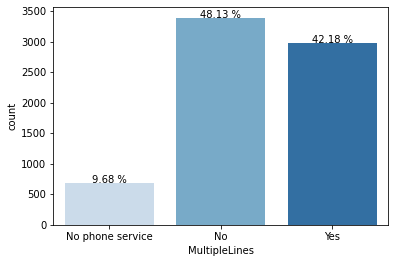

In [42]:
ax = sns.countplot(df["MultipleLines"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of MultipleLines based on Churn

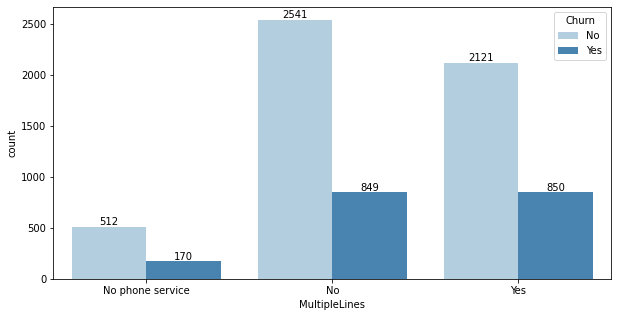

In [43]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["MultipleLines"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Churn on MultipleLine

In [44]:
listItem = []
for col in df["MultipleLines"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["MultipleLines"]==col)]["Churn"].count() / df[df["MultipleLines"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["MultipleLines"]==col)]["Churn"].count() / df[df["MultipleLines"]==col]["Churn"].count() * 100)
                    ])
    
dfMultipleLines = pd.DataFrame(listItem, columns='MultipleLines,Churn,No Churn'.split(','))
dfMultipleLines

,MultipleLines,Churn,No Churn
0,No phone service,24.926686,75.073314
1,No,25.044248,74.955752
2,Yes,28.609896,71.390104


# * INTERNET SERVICE *

In [45]:
df["InternetService"].unique()

array(['DSL', 'Fiber optic', 'No'], dtype=object)

In [46]:
df["InternetService"].value_counts()

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64

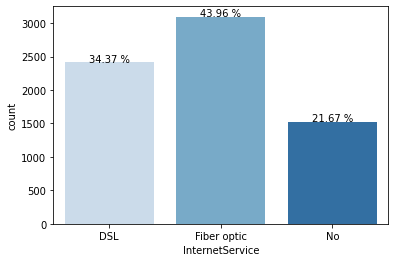

In [47]:
ax = sns.countplot(df["InternetService"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of InternetService based on Churn

In [48]:
df.groupby("Churn")["InternetService"].value_counts()

Churn  InternetService
No     DSL                1962
       Fiber optic        1799
       No                 1413
Yes    Fiber optic        1297
       DSL                 459
       No                  113
Name: InternetService, dtype: int64

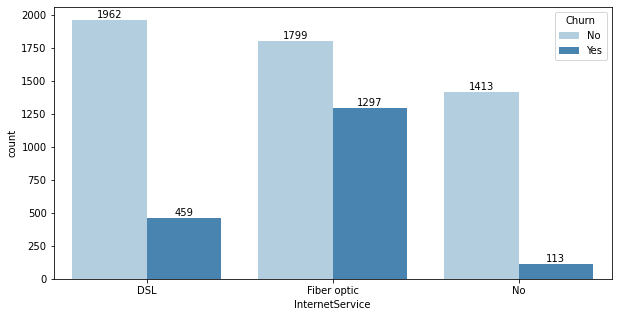

In [49]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["InternetService"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage InternetService on Churn

In [50]:
listItem = []
for col in df["InternetService"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["InternetService"]==col)]["Churn"].count() / df[df["InternetService"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["InternetService"]==col)]["Churn"].count() / df[df["InternetService"]==col]["Churn"].count() * 100)
                    ])
    
dfInternetService = pd.DataFrame(listItem, columns='InternetService,Churn,No Churn'.split(','))
dfInternetService

,InternetService,Churn,No Churn
0,DSL,18.959108,81.040892
1,Fiber optic,41.892765,58.107235
2,No,7.404980,92.595020


# * OnlineSecurity *

In [51]:
df["OnlineSecurity"].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [52]:
df["OnlineSecurity"].value_counts()

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64

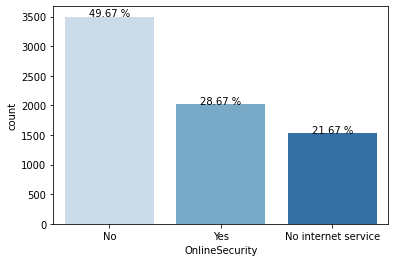

In [53]:
ax = sns.countplot(df["OnlineSecurity"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of OnlineSecurity based on Churn

In [54]:
df.groupby("Churn")["OnlineSecurity"].value_counts()

Churn  OnlineSecurity     
No     No                     2037
       Yes                    1724
       No internet service    1413
Yes    No                     1461
       Yes                     295
       No internet service     113
Name: OnlineSecurity, dtype: int64

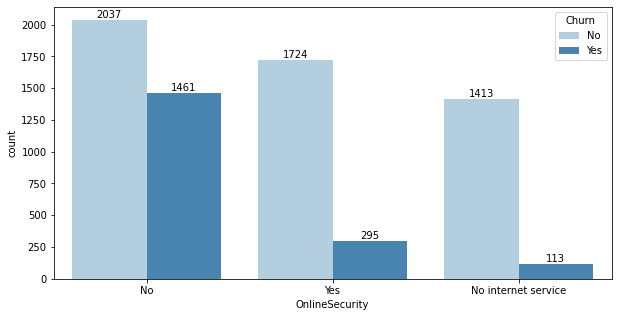

In [55]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["OnlineSecurity"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Online Security on churn

In [56]:
listItem = []
for col in df["OnlineSecurity"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["OnlineSecurity"]==col)]["Churn"].count() / df[df["OnlineSecurity"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["OnlineSecurity"]==col)]["Churn"].count() / df[df["OnlineSecurity"]==col]["Churn"].count() * 100)
                    ])
    
dfOnlineSecurity = pd.DataFrame(listItem, columns='OnlineSecurity,Churn,No Churn'.split(','))
dfOnlineSecurity

,OnlineSecurity,Churn,No Churn
0,No,41.766724,58.233276
1,Yes,14.611194,85.388806
2,No internet service,7.404980,92.595020


# * OnlineBackup *

In [57]:
df["OnlineBackup"].unique()

array(['Yes', 'No', 'No internet service'], dtype=object)

In [58]:
df["OnlineBackup"].value_counts()

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64

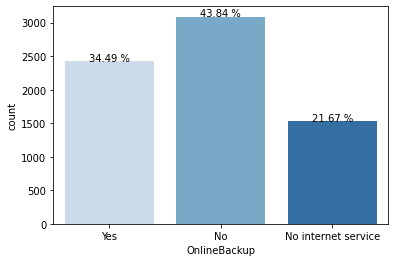

In [59]:
ax = sns.countplot(df["OnlineBackup"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of OnlineBackup based on Churn

In [60]:
df.groupby("Churn")["OnlineBackup"].value_counts()

Churn  OnlineBackup       
No     Yes                    1906
       No                     1855
       No internet service    1413
Yes    No                     1233
       Yes                     523
       No internet service     113
Name: OnlineBackup, dtype: int64

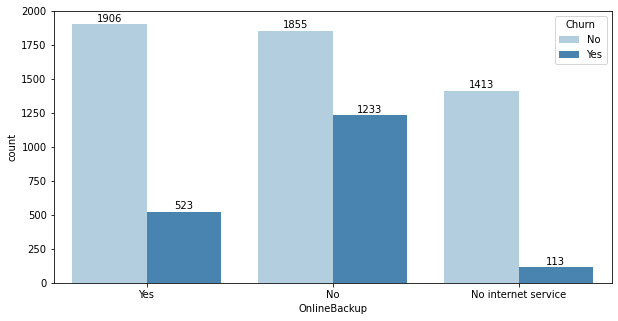

In [61]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["OnlineBackup"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage OnlineBackup on churn

In [62]:
listItem = []
for col in df["OnlineBackup"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["OnlineBackup"]==col)]["Churn"].count() / df[df["OnlineBackup"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["OnlineBackup"]==col)]["Churn"].count() / df[df["OnlineBackup"]==col]["Churn"].count() * 100)
                    ])
    
dfOnlineBackup = pd.DataFrame(listItem, columns='OnlineBackup,Churn,No Churn'.split(','))
dfOnlineBackup

,OnlineBackup,Churn,No Churn
0,Yes,21.531494,78.468506
1,No,39.928756,60.071244
2,No internet service,7.404980,92.595020


# * DeviceProtection *

In [63]:
df["DeviceProtection"].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [64]:
df["DeviceProtection"].value_counts()

No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype: int64

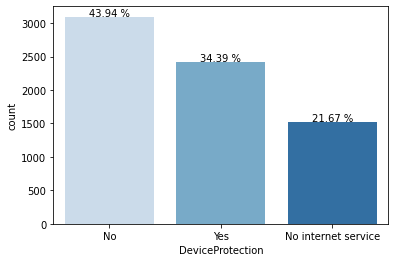

In [65]:
ax = sns.countplot(df["DeviceProtection"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of DeviceProtection based on Churn

In [66]:
df.groupby("Churn")["DeviceProtection"].value_counts()

Churn  DeviceProtection   
No     No                     1884
       Yes                    1877
       No internet service    1413
Yes    No                     1211
       Yes                     545
       No internet service     113
Name: DeviceProtection, dtype: int64

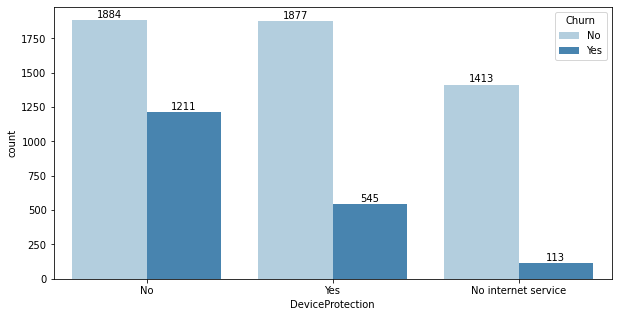

In [67]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["DeviceProtection"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage DeviceProtection on Churn

In [68]:
listItem = []
for col in df["DeviceProtection"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["DeviceProtection"]==col)]["Churn"].count() / df[df["DeviceProtection"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["DeviceProtection"]==col)]["Churn"].count() / df[df["DeviceProtection"]==col]["Churn"].count() * 100)
                    ])
    
dfDeviceProtection = pd.DataFrame(listItem, columns='DeviceProtection,Churn,No Churn'.split(','))
dfDeviceProtection

,DeviceProtection,Churn,No Churn
0,No,39.127625,60.872375
1,Yes,22.502064,77.497936
2,No internet service,7.404980,92.595020


# * TechSupport *

In [69]:
df["TechSupport"].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [70]:
df["TechSupport"].value_counts()

No                     3473
Yes                    2044
No internet service    1526
Name: TechSupport, dtype: int64

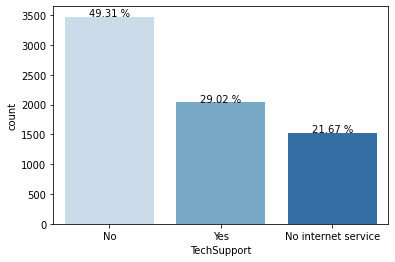

In [71]:
ax = sns.countplot(df["TechSupport"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of TechSupport based on Churn

In [72]:
df.groupby("Churn")["TechSupport"].value_counts()

Churn  TechSupport        
No     No                     2027
       Yes                    1734
       No internet service    1413
Yes    No                     1446
       Yes                     310
       No internet service     113
Name: TechSupport, dtype: int64

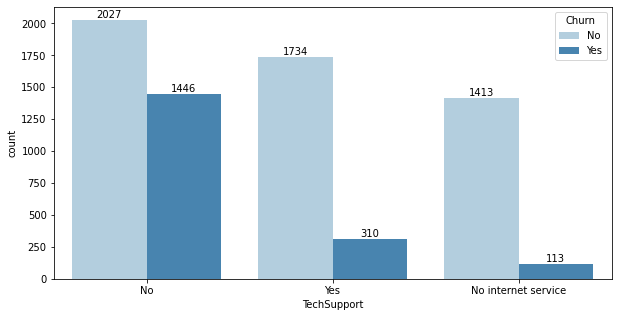

In [73]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["TechSupport"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage TechSupport on Churn

In [74]:
listItem = []
for col in df["TechSupport"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["TechSupport"]==col)]["Churn"].count() / df[df["TechSupport"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["TechSupport"]==col)]["Churn"].count() / df[df["TechSupport"]==col]["Churn"].count() * 100)
                    ])
    
dfTechSupport = pd.DataFrame(listItem, columns='TechSupport,Churn,No Churn'.split(','))
dfTechSupport

,TechSupport,Churn,No Churn
0,No,41.635474,58.364526
1,Yes,15.166341,84.833659
2,No internet service,7.404980,92.595020


# * StreamingTV *

In [75]:
df["StreamingTV"].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [76]:
df["StreamingTV"].value_counts()

No                     2810
Yes                    2707
No internet service    1526
Name: StreamingTV, dtype: int64

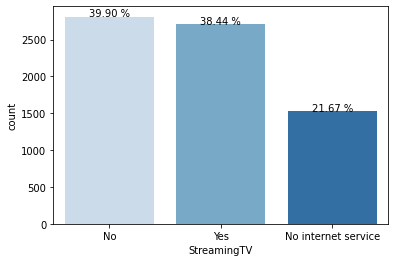

In [77]:
ax = sns.countplot(df["StreamingTV"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of StreamingTV based on Churn

In [78]:
df.groupby("Churn")["StreamingTV"].value_counts()

Churn  StreamingTV        
No     Yes                    1893
       No                     1868
       No internet service    1413
Yes    No                      942
       Yes                     814
       No internet service     113
Name: StreamingTV, dtype: int64

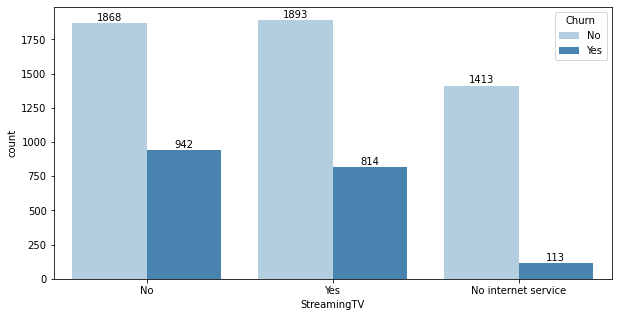

In [79]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["StreamingTV"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 18,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage StreamingTV on Churn

In [80]:
listItem = []
for col in df["StreamingTV"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["StreamingTV"]==col)]["Churn"].count() / df[df["StreamingTV"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["StreamingTV"]==col)]["Churn"].count() / df[df["StreamingTV"]==col]["Churn"].count() * 100)
                    ])
    
dfStreamingTV = pd.DataFrame(listItem, columns='StreamingTV,Churn,No Churn'.split(','))
dfStreamingTV

,StreamingTV,Churn,No Churn
0,No,33.523132,66.476868
1,Yes,30.070188,69.929812
2,No internet service,7.404980,92.595020


# * Contract *

In [81]:
df["Contract"].unique()

array(['Month-to-month', 'One year', 'Two year'], dtype=object)

In [82]:
df["Contract"].value_counts()

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64

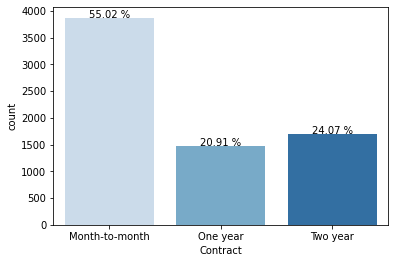

In [83]:
ax = sns.countplot(df["Contract"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
plt.show()

### Distribution of Contract based on Churn

In [84]:
df.groupby("Churn")["Contract"].value_counts()

Churn  Contract      
No     Month-to-month    2220
       Two year          1647
       One year          1307
Yes    Month-to-month    1655
       One year           166
       Two year            48
Name: Contract, dtype: int64

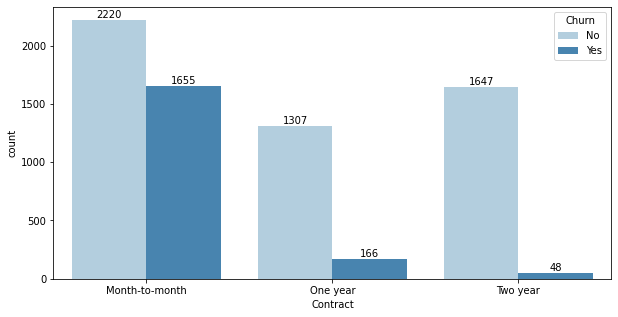

In [85]:
plt.figure(figsize=(10,5))
ax = sns.countplot(df["Contract"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 20,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage Contract on Churn

In [86]:
listItem = []
for col in df["Contract"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["Contract"]==col)]["Churn"].count() / df[df["Contract"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["Contract"]==col)]["Churn"].count() / df[df["Contract"]==col]["Churn"].count() * 100)
                    ])
    
dfContract = pd.DataFrame(listItem, columns='Contract,Churn,No Churn'.split(','))
dfContract

,Contract,Churn,No Churn
0,Month-to-month,42.709677,57.290323
1,One year,11.269518,88.730482
2,Two year,2.831858,97.168142


# * PaperlessBilling *

In [87]:
df["PaperlessBilling"].unique()

array(['Yes', 'No'], dtype=object)

In [88]:
df["PaperlessBilling"].value_counts()

Yes    4171
No     2872
Name: PaperlessBilling, dtype: int64

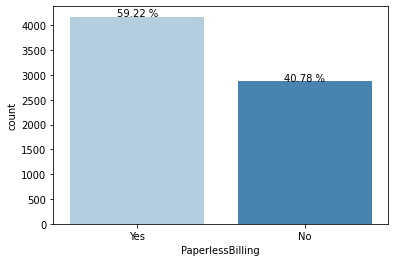

In [89]:
ax = sns.countplot(df["PaperlessBilling"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height/len(df)*100),
            ha="center"
           ) 
plt.show()

### Distribution of PaperlessBilling based on Churn

In [90]:
df.groupby("Churn")["PaperlessBilling"].value_counts()

Churn  PaperlessBilling
No     Yes                 2771
       No                  2403
Yes    Yes                 1400
       No                   469
Name: PaperlessBilling, dtype: int64

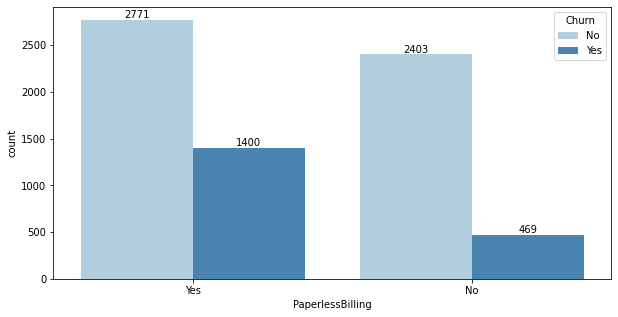

In [91]:
plt.figure(figsize=(10,5))
ax= sns.countplot(df["PaperlessBilling"], hue = df["Churn"], palette = "Blues")
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 20,
            '{:.0f}'.format(height),
            ha="center"
           ) 
plt.show()

### Percentage PaperlessBilling on churn

In [92]:
listItem = []
for col in df["PaperlessBilling"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["PaperlessBilling"]==col)]["Churn"].count() / df[df["PaperlessBilling"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["PaperlessBilling"]==col)]["Churn"].count() / df[df["PaperlessBilling"]==col]["Churn"].count() * 100)
                    ])
    
dfPaperlessBilling = pd.DataFrame(listItem, columns='PaperlessBilling,Churn,No Churn'.split(','))
dfPaperlessBilling

,PaperlessBilling,Churn,No Churn
0,Yes,33.565092,66.434908
1,No,16.330084,83.669916


# * PaymentMethod *

In [93]:
df["PaymentMethod"].unique()

array(['Electronic check', 'Mailed check', 'Bank transfer (automatic)',
       'Credit card (automatic)'], dtype=object)

In [94]:
df["PaymentMethod"].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

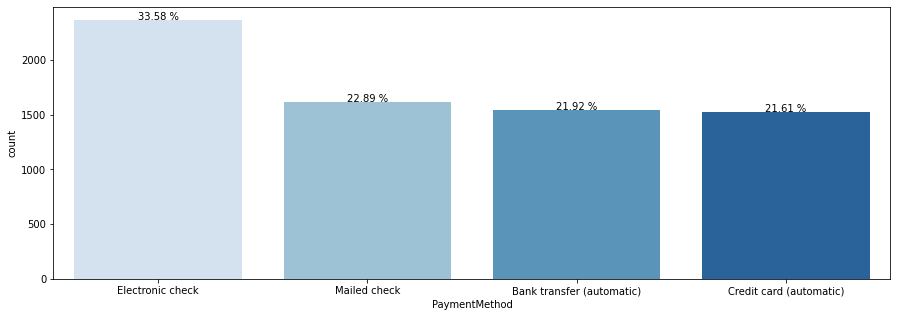

In [95]:
plt.figure(figsize=(15,5))
ax = sns.countplot(df["PaymentMethod"],palette="Blues") 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f} %'.format(height*100/len(df)),
            ha="center"
           ) 
          
plt.show()

### Distribution of PaymentMethod based on Churn

In [96]:
df.groupby("Churn")["PaymentMethod"].value_counts()

Churn  PaymentMethod            
No     Mailed check                 1304
       Electronic check             1294
       Credit card (automatic)      1290
       Bank transfer (automatic)    1286
Yes    Electronic check             1071
       Mailed check                  308
       Bank transfer (automatic)     258
       Credit card (automatic)       232
Name: PaymentMethod, dtype: int64

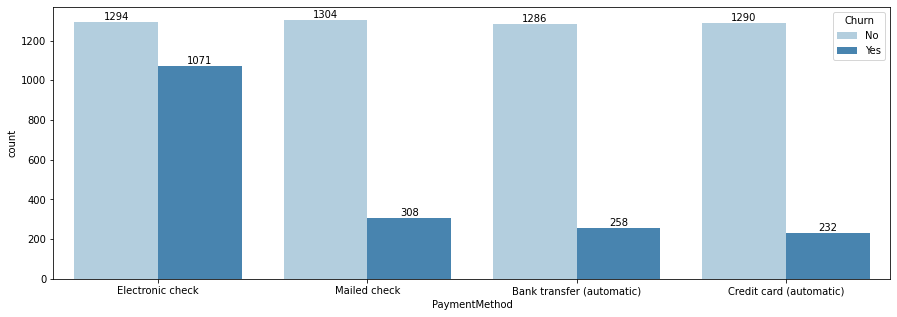

In [97]:
plt.figure(figsize=(15,5))
ax = sns.countplot(df["PaymentMethod"], hue = df["Churn"], palette = "Blues")   
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            '{:.0f}'.format(height),
            ha="center"
           )     
plt.show()             

### Percentage PaymentMethod on Churn

In [98]:
listItem = []
for col in df["PaymentMethod"].unique():
    listItem.append([col, 
                    (df[(df["Churn"]=="Yes")&(df["PaymentMethod"]==col)]["Churn"].count() / df[df["PaymentMethod"]==col]["Churn"].count() * 100),
                    (df[(df["Churn"]== "No")&(df["PaymentMethod"]==col)]["Churn"].count() / df[df["PaymentMethod"]==col]["Churn"].count() * 100)
                    ])
    
dfPaperlessBilling = pd.DataFrame(listItem, columns='PaymentMethod,Churn,No Churn'.split(','))
dfPaperlessBilling

,PaymentMethod,Churn,No Churn
0,Electronic check,45.285412,54.714588
1,Mailed check,19.106700,80.893300
2,Bank transfer (automatic),16.709845,83.290155
3,Credit card (automatic),15.243101,84.756899


# NUMERICAL FEATURE DISTRIBUTION 

# * TENURE *

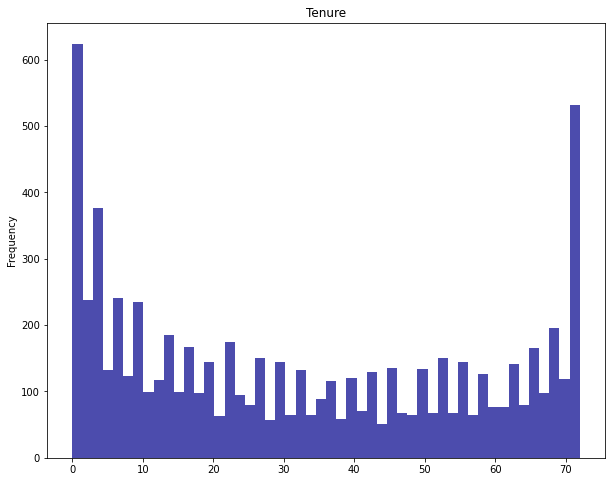

In [99]:
plt.subplots(figsize=(10,8))
#Charting the histogram
df["tenure"].plot.hist(color='DarkBlue', alpha=0.7, bins=50, title='Tenure')
plt.show()

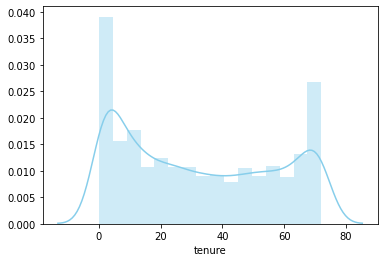

In [100]:
sns.distplot( df["tenure"] , kde=True, rug=False, color="skyblue")

- Distribusi data tenure mempunyai 2 mode (BI modal distribution) yang membuat data berpusat di dua mode tersebut
- kita punya customer di atas 60-70+ bulan yang merupakan customer loyal kita dan potensial
- Banyaknya customer 0-1 bulan memperlihatkan banyaknya customer hanya ingin mencoba service kita dan tidak melanjutkannya


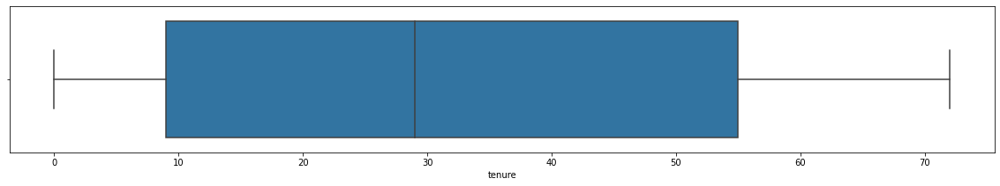

In [101]:
Kolom=["tenure"]
a = 1
plt.figure(figsize=(20,25))

for i in Kolom:
    plt.subplot(7,1,a)
    sns.boxplot(df[i])
    a += 1
plt.show()

- dari Visual di atas kita dapat melihat Tenure data tidak mempunyai outlier

### Relation MonthlyCharges based on Churn

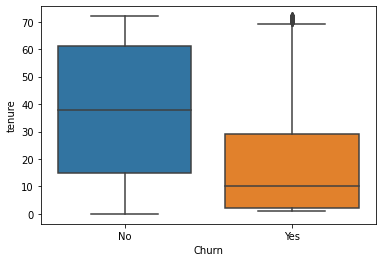

In [102]:
sns.boxplot(x = df["Churn"], y = df["tenure"])

- Sudah pasti dan jelas bahwa customer yang tidak churn adalah yang tenure bulannya lebih lama

# * MonthlyCharges *

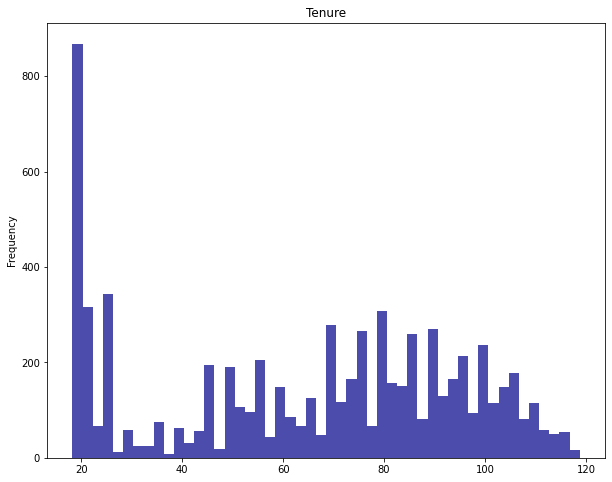

In [103]:
plt.subplots(figsize=(10,8))
#Charting the histogram
df["MonthlyCharges"].plot.hist(color='DarkBlue', alpha=0.7, bins=50, title='Tenure')
plt.show()

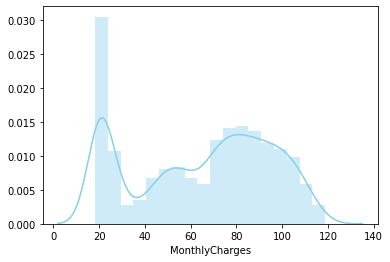

In [104]:
sns.distplot( df["MonthlyCharges"] , kde=True, rug=False, color="skyblue")

- dari visualisasi di atas kita liat juga hampir mempunyai 2 mode (bimodal distribution)
- Paling customer yang membayar 20-80 dollar sebulan berarti customer banyak yang hanya memakai basic service dari perusahaan
- Dari yang membayar 70-100 dollar terdapat customer yang pasti memakai lebih dari dua services dari perusahaan 

### Relation MonthlyCharges based on Churn

Text(0.5, 1.0, 'Distribution of monthly charges by churn')

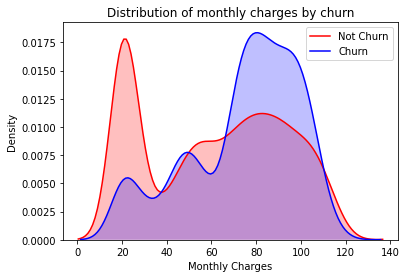

In [105]:
ax = sns.kdeplot(df["MonthlyCharges"][df["Churn"] == 'No'],
                color="Red", shade = True)
ax = sns.kdeplot(df["MonthlyCharges"][df["Churn"] == 'Yes'],
                ax =ax, color="Blue", shade= True)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Monthly Charges')
ax.set_title('Distribution of monthly charges by churn')

-Persentase kemungkinan customer churn adalah ketika monthly charges tinggi

### Cek Outlier MonthlyCharges

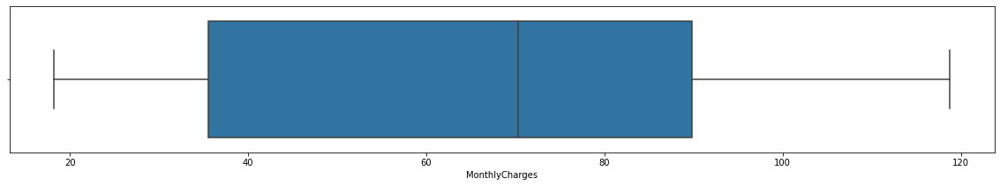

In [106]:
Kolom=["MonthlyCharges"]
a = 1
plt.figure(figsize=(20,25))

for i in Kolom:
    plt.subplot(7,1,a)
    sns.boxplot(df[i])
    a += 1
plt.show()

- Dari Visualisasi di atas kita lihat bahwa tidak terdapatnya outlier pada distribusi data di MonthlyCharges

# * TotalCharges *

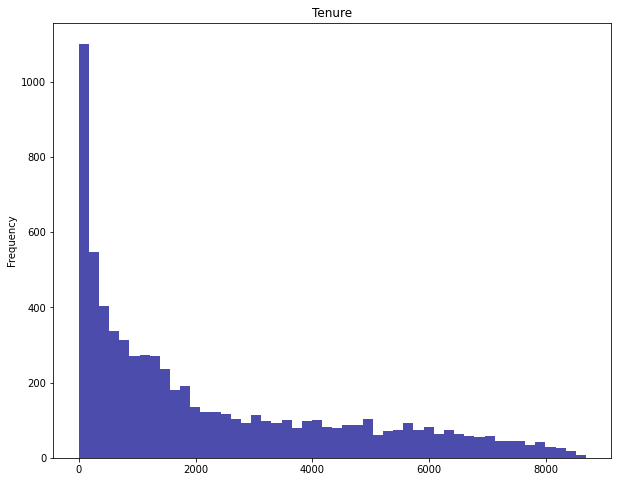

In [107]:
plt.subplots(figsize=(10,8))
#Charting the histogram
df["TotalChargesNum"].plot.hist(color='DarkBlue', alpha=0.7, bins=50, title='Tenure')
plt.show()

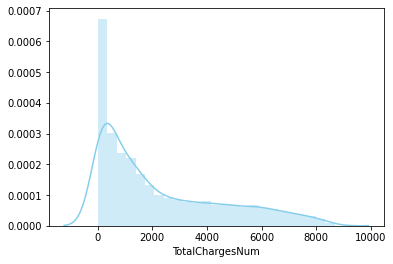

In [108]:
sns.distplot( df["TotalChargesNum"] , kde=True, rug=False, color="skyblue")

- Dari data Visualisasi di atas distribusinya baik
- Kebanyakan Customer menghabiskan sekitar hampir 1000 dollar
- Total customer telah menghabiskan sekita 9000 dollar

Text(0.5, 1.0, 'Distribution of TotalCharge by churn')

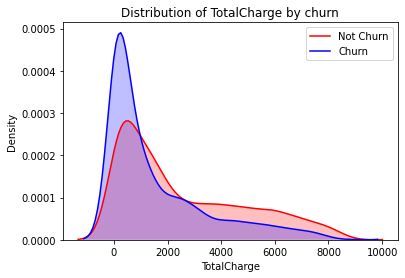

In [109]:
ax = sns.kdeplot(df["TotalChargesNum"][df["Churn"] == 'No'],
                color="Red", shade = True)
ax = sns.kdeplot(df["TotalChargesNum"][df["Churn"] == 'Yes'],
                ax =ax, color="Blue", shade= True)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('TotalCharge')
ax.set_title('Distribution of TotalCharge by churn')

- Customer Churn Tinggi ketika Total Charger rendah, karena total Charger adalah total pembayaran keseluruhan customer, semakin lama customer memakai jasa(besar tenure), semakin besar total charger, dan semakin besar tuner semakin kecil kemungkinan customer Churn

### Relation Totalcharge dan Tenure

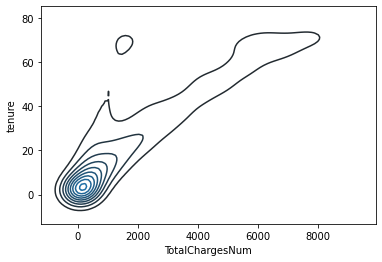

In [110]:
x = df["TotalChargesNum"]
y= df["tenure"]
sns.kdeplot(x,y)

### Outlier TotalCharges Cek

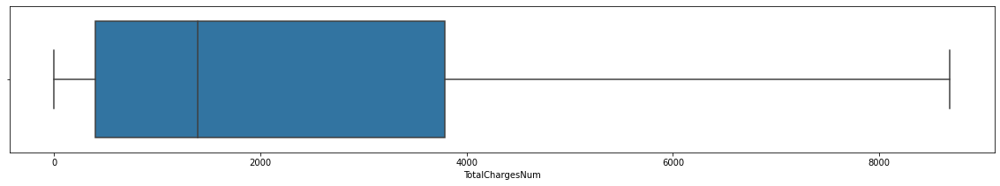

In [111]:
Kolom=["TotalChargesNum"]
a = 1
plt.figure(figsize=(20,25))

for i in Kolom:
    plt.subplot(7,1,a)
    sns.boxplot(df[i])
    a += 1
plt.show()

- Tidak ada outlier pada feature TotalCharges

# ENCODE CATEGORICAL FEATURE

In [112]:
def unik(columnname):
    print(columnname,":" ,df[columnname].unique())
for i in range(1,len(df.columns)):
    unik(df.columns[i])

SeniorCitizen : [0 1]
Partner : ['Yes' 'No']
Dependents : ['No' 'Yes']
tenure : [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
PhoneService : ['No' 'Yes']
MultipleLines : ['No phone service' 'No' 'Yes']
InternetService : ['DSL' 'Fiber optic' 'No']
OnlineSecurity : ['No' 'Yes' 'No internet service']
OnlineBackup : ['Yes' 'No' 'No internet service']
DeviceProtection : ['No' 'Yes' 'No internet service']
TechSupport : ['No' 'Yes' 'No internet service']
StreamingTV : ['No' 'Yes' 'No internet service']
StreamingMovies : ['No' 'Yes' 'No internet service']
Contract : ['Month-to-month' 'One year' 'Two year']
PaperlessBilling : ['Yes' 'No']
PaymentMethod : ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
MonthlyCharges : [29.85 56.95 53.85 ... 63.1  44.2  78.7 ]
Churn : ['No' 'Yes

In [113]:
df2 = df.copy()

In [114]:
le = LabelEncoder()
le_count = 0
for col in df2.columns[0:]:
    if df2[col].dtype == 'object':
        if len(list(df2[col].unique())) <= 2:
            le.fit(df2[col])
            df2[col] = le.transform(df2[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

6 columns were label encoded.


In [115]:
df2

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,Churn,TotalChargesNum
0,0,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,0,29.85
1,1,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,0,1889.50
2,1,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,1,108.15
3,1,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,0,1840.75
4,0,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,1,151.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,24,1,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,1,Mailed check,84.80,0,1990.50
7039,0,0,1,1,72,1,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,1,Credit card (automatic),103.20,0,7362.90
7040,0,0,1,1,11,0,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,1,Electronic check,29.60,0,346.45
7041,1,1,1,0,4,1,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Mailed check,74.40,1,306.60


In [116]:
df2 = pd.get_dummies(df2)

In [117]:
pd.set_option('display.max_columns', None)
df2

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,Churn,TotalChargesNum,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,29.85,0,29.85,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,0,56.95,0,1889.50,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,1,53.85,1,108.15,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,0,42.30,0,1840.75,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,1,70.70,1,151.65,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,24,1,1,84.80,0,1990.50,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1
7039,0,0,1,1,72,1,1,103.20,0,7362.90,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0
7040,0,0,1,1,11,0,1,29.60,0,346.45,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
7041,1,1,1,0,4,1,1,74.40,1,306.60,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1


- SCALLING dataset dengan menggunakan minmax Scaller, dengan range 0-5, Agar Performa Machine learning lebih baik jika skala antar feature seimbang

In [118]:
df2

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,Churn,TotalChargesNum,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,29.85,0,29.85,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,0,56.95,0,1889.50,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,1,53.85,1,108.15,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,0,42.30,0,1840.75,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,1,70.70,1,151.65,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,24,1,1,84.80,0,1990.50,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1
7039,0,0,1,1,72,1,1,103.20,0,7362.90,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0
7040,0,0,1,1,11,0,1,29.60,0,346.45,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
7041,1,1,1,0,4,1,1,74.40,1,306.60,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1


In [119]:
# scaler = MinMaxScaler(feature_range=(0, 5))
# Churn_col = list(df2.columns)
# Churn_col.remove("Churn")
# for col in Churn_col:
#     df2[col] = df2[col].astype(float)
#     df2[[col]] = scaler.fit_transform(df2[[col]])
# df2["Churn"] = pd.to_numeric(df2["Churn"], downcast='float')
# df2

# MACHINE LEARNING

## LOGISTIC REGRESSION

In [120]:
df_LR = df2.copy()

### SPLITTING DATASET ###

In [121]:
x_LR = df_LR.drop(["Churn"],axis=1)
y_LR = df_LR["Churn"]

### SPLITTING DATA TRAIN / TEST ###

In [122]:
xLR_train, xLR_test, yLR_train, yLR_test = train_test_split(x_LR, y_LR, test_size = 0.1, random_state = 0)

In [123]:

modelLR = LogisticRegression()

modelLR.fit(xLR_train,yLR_train)

LogisticRegression()

In [124]:
print(modelLR.coef_)
print(modelLR.intercept_)

[[-3.50262443e-02  2.67352581e-01  1.87689078e-02 -1.98957747e-01
  -6.24465845e-02 -2.72365042e-01  4.16599941e-01 -1.39820770e-03
   3.40977516e-04 -2.55249623e-01  1.02297450e-01 -1.71154193e-02
  -3.63294994e-01  3.27526944e-01 -1.34299542e-01  1.91214244e-01
  -1.34299542e-01 -2.26982294e-01  8.42568424e-02 -1.34299542e-01
  -1.20024892e-01 -7.93578315e-03 -1.34299542e-01 -2.78322669e-02
   1.63893319e-01 -1.34299542e-01 -1.99661369e-01 -1.37338521e-01
  -1.34299542e-01  1.01570471e-01 -9.15398803e-02 -1.34299542e-01
   5.57718302e-02  5.64912081e-01 -2.42586690e-01 -4.92392983e-01
  -8.10883375e-02 -2.06439684e-01  2.69379365e-01 -1.51918935e-01]]
[-0.17198688]


In [125]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelLR, xLR_train, yLR_train, cv=10)
print(clf_score)
clf_score.mean()

[0.79652997 0.80757098 0.80757098 0.8044164  0.80126183 0.82334385
 0.79810726 0.78706625 0.79936809 0.81516588]


0.80404014731313

- Accuracy Logreg tanpa tuning dan intervensi semua feature sekitar 80 % dari cross validation

In [126]:
y_predLR = modelLR.predict(xLR_test)

### Evaluating Model ###

In [127]:
confusion_matrix(yLR_test,y_predLR)

array([[470,  55],
       [ 88,  92]])

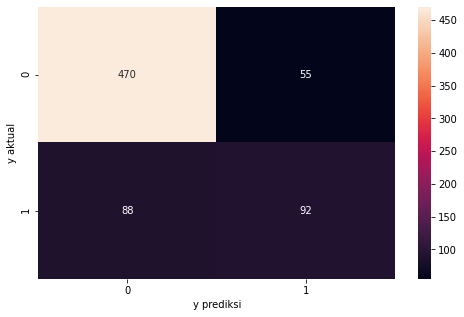

In [128]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR_test,y_predLR),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

### confusion matrix report 



In [129]:
print(classification_report(yLR_test,y_predLR))

precision    recall  f1-score   support

           0       0.84      0.90      0.87       525
           1       0.63      0.51      0.56       180

    accuracy                           0.80       705
   macro avg       0.73      0.70      0.72       705
weighted avg       0.79      0.80      0.79       705



In [130]:
pd.DataFrame(data= [accuracy_score(yLR_test,y_predLR)*100,recall_score(yLR_test,y_predLR)*100,precision_score(yLR_test,y_predLR)*100,roc_auc_score(yLR_test,y_predLR)*100,f1_score(yLR_test,y_predLR)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,79.716312
recall,51.111111
precission,62.585034
roc_auc_score,70.317460
F1 Score,56.269113


In [131]:
pd.DataFrame(data= [modelLR.score(xLR_train,yLR_train)*100,modelLR.score(xLR_test,yLR_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.687914
Model Score in data Test,79.716312


#### Train 80 Test 20

In [132]:
x_LR1 = df_LR.drop(["Churn"],axis=1)
y_LR1 = df_LR["Churn"]
xLR1_train, xLR1_test, yLR1_train, yLR1_test = train_test_split(x_LR1, y_LR1, test_size = 0.2, random_state = 0)
modelLR1 = LogisticRegression()
modelLR1.fit(xLR1_train,yLR1_train)
y_predLR1 = modelLR1.predict(xLR1_test)



In [133]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelLR1, xLR1_train, yLR1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.80673759 0.82269504 0.79964539 0.81737589 0.79396092 0.80817052
 0.79396092 0.78330373 0.80817052 0.81882771]


0.8052848216872629

- Hasil Accuracy hampir sama dengan train 90 test 10

In [134]:
confusion_matrix(yLR1_test,y_predLR1)

array([[934, 107],
       [179, 189]])

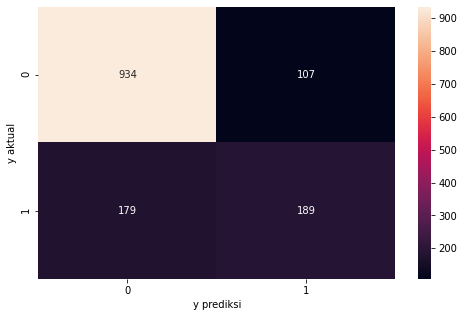

In [135]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR1_test,y_predLR1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [136]:
print(classification_report(yLR1_test,y_predLR1))

precision    recall  f1-score   support

           0       0.84      0.90      0.87      1041
           1       0.64      0.51      0.57       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [137]:
pd.DataFrame(data= [accuracy_score(yLR1_test,y_predLR1)*100,recall_score(yLR1_test,y_predLR1)*100,precision_score(yLR1_test,y_predLR1)*100,roc_auc_score(yLR1_test,y_predLR1)*100,f1_score(yLR1_test,y_predLR1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,79.701916
recall,51.358696
precission,63.851351
roc_auc_score,70.540059
F1 Score,56.927711


In [138]:
pd.DataFrame(data= [modelLR1.score(xLR1_train,yLR1_train)*100,modelLR1.score(xLR1_test,yLR1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.741924
Model Score in data Test,79.701916


### Parameter Tuning

In [139]:
# #parameter model linear regression yang akan dituned + value di setiap parameter
# penalty = ['l1', 'l2', 'elasticnet', 'none']
# solver = ['newton-cg', 'lbfgs', 'liblinier', 'sag', 'saga']
# max_iter = [1, 10, 100, 1000, 10000]

# # simpan dalam variabel dengan nama 'param'
# param = {'penalty': penalty, 'solver': solver, 'max_iter': max_iter}
# param

{'penalty': ['l1', 'l2', 'elasticnet', 'none'],
 'solver': ['newton-cg', 'lbfgs', 'liblinier', 'sag', 'saga'],
 'max_iter': [1, 10, 100, 1000, 10000]}

In [140]:
# model_LR_tun = LogisticRegression()
# model_LR_tunRS = RandomizedSearchCV(estimator = model_LR_tun, param_distributions = param, cv = 5)

In [141]:
# model_LR_tunRS.fit(xLR_train, yLR_train)
# model_LR_tunRS.best_params_

{'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 10000}

#### Random Search

In [733]:
model_LogReg_RS = LogisticRegression(solver='lbfgs', penalty = 'l2', max_iter = 1000)
model_LogReg_RS.fit(xLR_train, yLR_train)

LogisticRegression(max_iter=1000)

### Parameter Tuning Semua Feature tanpa data intervensi Train 90 Test 10

In [143]:
print(model_LogReg_RS.coef_)
print(model_LogReg_RS.intercept_)

[[-4.42757920e-02  2.58675952e-01  1.45623649e-02 -1.96956517e-01
  -6.30810425e-02 -2.72888119e-01  3.97682997e-01  2.32066518e-04
   3.25529302e-04 -2.64769052e-01  9.43752211e-02 -8.11906686e-03
  -3.71607380e-01  3.28161576e-01 -1.35067093e-01  1.80809430e-01
  -1.35067093e-01 -2.24255234e-01  7.32584000e-02 -1.35067093e-01
  -1.16704204e-01 -1.75349940e-02 -1.35067093e-01 -2.59108103e-02
   1.53684985e-01 -1.35067093e-01 -1.97130789e-01 -1.48461106e-01
  -1.35067093e-01  1.05015302e-01 -1.05361138e-01 -1.35067093e-01
   6.19153341e-02  5.41684282e-01 -2.29915933e-01 -4.90281246e-01
  -7.99545287e-02 -2.02690465e-01  2.61351035e-01 -1.57218940e-01]]
[-0.18048124]


In [144]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(model_LogReg_RS, xLR_train, yLR_train, cv=10)
print(clf_score)
clf_score.mean()

[0.79652997 0.81230284 0.80757098 0.8044164  0.80283912 0.81861199
 0.79810726 0.78864353 0.79620853 0.81516588]


0.8040396489601866

- Accuracy cross validation tidak banyak berbeda dengan tanpa tuning parameter sekitar 80% 

In [734]:
y_pred_LR_RS = model_LogReg_RS.predict(xLR_test)

In [735]:
confusion_matrix(yLR_test,y_pred_LR_RS)

array([[470,  55],
       [ 88,  92]])

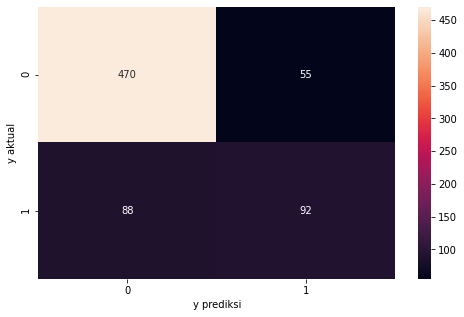

In [736]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR_test,y_pred_LR_RS),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [737]:
print(classification_report(yLR_test,y_pred_LR_RS))

precision    recall  f1-score   support

           0       0.84      0.90      0.87       525
           1       0.63      0.51      0.56       180

    accuracy                           0.80       705
   macro avg       0.73      0.70      0.72       705
weighted avg       0.79      0.80      0.79       705



In [738]:
pd.DataFrame(data = [accuracy_score(yLR_test, y_pred_LR_RS)*100, recall_score(yLR_test, y_pred_LR_RS)*100,
                    precision_score(yLR_test, y_pred_LR_RS)*100, roc_auc_score(yLR_test, y_pred_LR_RS)*100,
                    f1_score(yLR_test, y_pred_LR_RS)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.716312
recall,51.111111
precision,62.585034
roc_auc_score,70.317460
f1_score,56.269113


In [739]:
pd.DataFrame(data= [model_LogReg_RS.score(xLR_train,yLR_train)*100,modelLR.score(xLR_test,yLR_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.703692
Model Score in data Test,79.716312


### Parameter Tuning Semua Feature tanpa data intervensi Train 80 Test 20

In [740]:
y_pred_LR_RS1 = model_LogReg_RS.predict(xLR1_test)


In [741]:
confusion_matrix(yLR_test,y_pred_LR_RS)

array([[470,  55],
       [ 88,  92]])

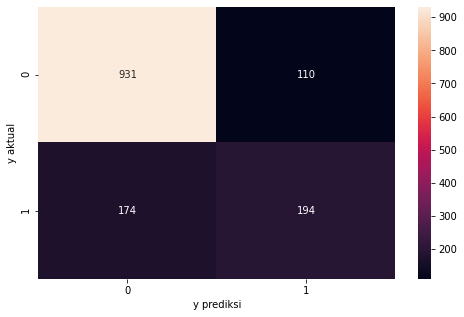

In [742]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR1_test,y_pred_LR_RS1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [743]:
print(classification_report(yLR1_test,y_pred_LR_RS1))

precision    recall  f1-score   support

           0       0.84      0.89      0.87      1041
           1       0.64      0.53      0.58       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [744]:
pd.DataFrame(data = [accuracy_score(yLR1_test, y_pred_LR_RS1)*100, recall_score(yLR1_test, y_pred_LR_RS1)*100,
                    precision_score(yLR1_test, y_pred_LR_RS1)*100, roc_auc_score(yLR1_test, y_pred_LR_RS1)*100,
                    f1_score(yLR1_test, y_pred_LR_RS1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.843861
recall,52.717391
precision,63.815789
roc_auc_score,71.075314
f1_score,57.738095


In [745]:
pd.DataFrame(data= [model_LogReg_RS.score(xLR1_train,yLR1_train)*100,modelLR.score(xLR1_test,yLR1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.795172
Model Score in data Test,79.985806


#### Grid

### Param tuning GS semua feature tanpa intervensi 90

In [157]:
# model_LR2 = LogisticRegression()
# model_LR_GS = GridSearchCV(model_LR2, param_grid= param, cv = 5)

In [158]:
# model_LR_GS.fit(xLR_train, yLR_train)
# model_LR_GS.best_params_

In [746]:
model_LogReg_GS = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GS.fit(xLR_train, yLR_train)

LogisticRegression(solver='newton-cg')

In [160]:
print(model_LogReg_GS.coef_)
print(model_LogReg_GS.intercept_)

[[-4.31494556e-02  2.25290201e-01 -1.17489434e-03 -1.75551987e-01
  -6.28133275e-02 -1.09000189e-01  3.53798254e-01 -8.15826894e-03
   3.38779104e-04 -2.14392043e-01  1.08999444e-01  1.05391854e-01
  -3.94191150e-01  5.13519485e-01 -1.19329080e-01  2.45092019e-01
  -1.19329080e-01 -1.25763683e-01  1.35212044e-01 -1.19329080e-01
  -1.58837089e-02  5.57266705e-02 -1.19329080e-01  6.36016648e-02
   2.15338231e-01 -1.19329080e-01 -9.60098953e-02 -9.47470156e-02
  -1.19329080e-01  2.14075351e-01 -6.26012868e-02 -1.19329080e-01
   1.81929622e-01  6.76930392e-01 -4.22673830e-02 -6.34663754e-01
  -4.05427875e-02 -1.54642856e-01  3.01022398e-01 -1.05837500e-01]]
[-0.4916926]


In [161]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(model_LogReg_GS, xLR_train, yLR_train, cv=10)
print(clf_score)
clf_score.mean()

[0.79652997 0.81072555 0.81230284 0.80283912 0.80283912 0.8170347
 0.79652997 0.78706625 0.79462875 0.82464455]


0.8045140809624192

In [747]:
y_pred_LR_GS = model_LogReg_GS.predict(xLR_test)

In [748]:
confusion_matrix(yLR_test,y_pred_LR_GS)

array([[470,  55],
       [ 89,  91]])

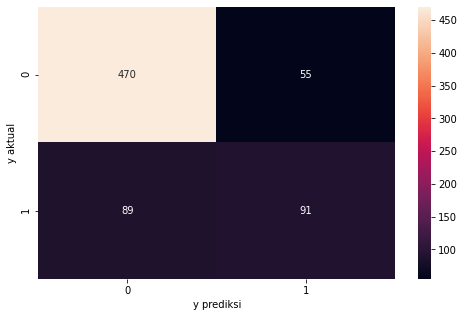

In [749]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR_test,y_pred_LR_GS),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [750]:
pd.DataFrame(data = [accuracy_score(yLR_test, y_pred_LR_GS)*100, recall_score(yLR_test, y_pred_LR_GS)*100,
                    precision_score(yLR_test, y_pred_LR_GS)*100, roc_auc_score(yLR_test, y_pred_LR_GS)*100,
                    f1_score(yLR_test, y_pred_LR_GS)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.574468
recall,50.555556
precision,62.328767
roc_auc_score,70.039683
f1_score,55.828221


In [751]:
pd.DataFrame(data= [model_LogReg_GS.score(xLR_train,yLR_train)*100,model_LogReg_GS.score(xLR_test,yLR_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.719470
Model Score in data Test,79.574468


### Param tuning GS semua feature tanpa intervensi Train 80

In [752]:
model_LogReg_GS1 = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GS1.fit(xLR1_train, yLR1_train)

LogisticRegression(solver='newton-cg')

In [168]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(model_LogReg_GS1, xLR1_train, yLR1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.81382979 0.81914894 0.79609929 0.81382979 0.79928952 0.80817052
 0.79040853 0.78330373 0.80639432 0.82060391]


0.8051078316516131

In [753]:
y_pred_LR_GS1 = model_LogReg_GS1.predict(xLR1_test)

In [754]:
confusion_matrix(yLR1_test,y_pred_LR_GS1)

array([[931, 110],
       [175, 193]])

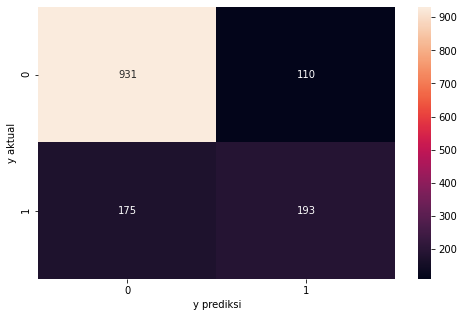

In [755]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLR1_test,y_pred_LR_GS1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [756]:
pd.DataFrame(data = [accuracy_score(yLR1_test, y_pred_LR_GS1)*100, recall_score(yLR1_test, y_pred_LR_GS1)*100,
                    precision_score(yLR1_test, y_pred_LR_GS1)*100, roc_auc_score(yLR1_test, y_pred_LR_GS1)*100,
                    f1_score(yLR1_test, y_pred_LR_GS1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.772889
recall,52.445652
precision,63.696370
roc_auc_score,70.939445
f1_score,57.526080


In [757]:
pd.DataFrame(data= [model_LogReg_GS1.score(xLR1_train,yLR1_train)*100,model_LogReg_GS1.score(xLR1_test,yLR1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.812922
Model Score in data Test,79.772889


## Test Model Logistic Regression With Feature Selection

In [758]:
corr=df2.corr()
corr

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,Churn,TotalChargesNum,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
gender,1.000000,-0.001874,-0.001808,0.010517,0.005106,-0.006488,-0.011754,-0.014569,-0.008612,-0.000080,0.004476,0.006488,-0.008414,0.006568,-0.011286,0.006026,0.010429,0.006026,-0.017021,0.008191,0.006026,-0.013773,-0.002988,0.006026,-0.002105,0.003397,0.006026,-0.009212,0.003267,0.006026,-0.008393,0.005374,0.006026,-0.010487,-0.003386,0.008026,-0.003695,-0.016024,0.001215,0.000752,0.013744
SeniorCitizen,-0.001874,1.000000,0.016479,-0.211185,0.016567,0.008576,0.156530,0.220173,0.150889,0.103006,-0.136213,-0.008576,0.142948,-0.108322,0.255338,-0.182742,0.185532,-0.182742,-0.038653,0.087952,-0.182742,0.066572,0.094810,-0.182742,0.059428,0.205620,-0.182742,-0.060625,0.049062,-0.182742,0.105378,0.034210,-0.182742,0.120176,0.138360,-0.046262,-0.117000,-0.016159,-0.024135,0.171718,-0.153477
Partner,-0.001808,0.016479,1.000000,0.452676,0.379697,0.017706,-0.014877,0.096848,-0.150448,0.317504,-0.129929,-0.017706,0.142057,-0.000851,0.000304,0.000615,-0.129936,0.000615,0.143106,-0.136058,0.000615,0.141498,-0.147692,0.000615,0.153786,-0.109443,0.000615,0.119999,-0.124357,0.000615,0.124666,-0.117529,0.000615,0.117412,-0.280865,0.082783,0.248091,0.110706,0.082029,-0.083852,-0.095125
Dependents,0.010517,-0.211185,0.452676,1.000000,0.159712,-0.001762,-0.111377,-0.113890,-0.164221,0.062078,0.023198,0.001762,-0.024526,0.052010,-0.165818,0.139812,-0.188434,0.139812,0.080972,-0.138756,0.139812,0.023671,-0.129415,0.139812,0.013963,-0.172645,0.139812,0.063268,-0.101176,0.139812,-0.016558,-0.078198,0.139812,-0.039741,-0.231720,0.068368,0.204613,0.052021,0.060267,-0.150642,0.059071
tenure,0.005106,0.016567,0.379697,0.159712,1.000000,0.008448,0.006152,0.247900,-0.352229,0.826178,-0.323088,-0.008448,0.331941,0.013274,0.019720,-0.039062,-0.263746,-0.039062,0.327203,-0.312694,-0.039062,0.360277,-0.312740,-0.039062,0.360653,-0.262143,-0.039062,0.324221,-0.245039,-0.039062,0.279756,-0.252220,-0.039062,0.286111,-0.645561,0.202570,0.558533,0.243510,0.233006,-0.208363,-0.233852
PhoneService,-0.006488,0.008576,0.017706,-0.001762,0.008448,1.000000,0.016505,0.247398,0.011942,0.113214,0.315431,-1.000000,0.279690,-0.452425,0.289999,0.172209,-0.057880,0.172209,-0.092893,-0.092867,0.172209,-0.052312,-0.074776,0.172209,-0.071227,-0.054447,0.172209,-0.096340,-0.122455,0.172209,-0.022574,-0.112254,0.172209,-0.032959,-0.000742,-0.002791,0.003519,0.007556,-0.007721,0.003062,-0.003319
PaperlessBilling,-0.011754,0.156530,-0.014877,-0.111377,0.006152,0.016505,1.000000,0.352150,0.191825,0.158574,-0.151864,-0.016505,0.163530,-0.063121,0.326853,-0.321013,0.267793,-0.321013,-0.003636,0.145120,-0.321013,0.126735,0.167121,-0.321013,0.103797,0.230136,-0.321013,0.037880,0.047712,-0.321013,0.223841,0.059488,-0.321013,0.211716,0.169096,-0.051391,-0.147889,-0.016332,-0.013589,0.208865,-0.205398
MonthlyCharges,-0.014569,0.220173,0.096848,-0.113890,0.247900,0.247398,0.352150,1.000000,0.193356,0.651174,-0.338314,-0.247398,0.490434,-0.160189,0.787066,-0.763557,0.360898,-0.763557,0.296594,0.210753,-0.763557,0.441780,0.171836,-0.763557,0.482692,0.322076,-0.763557,0.338304,0.016951,-0.763557,0.629603,0.018075,-0.763557,0.627429,0.060165,0.004904,

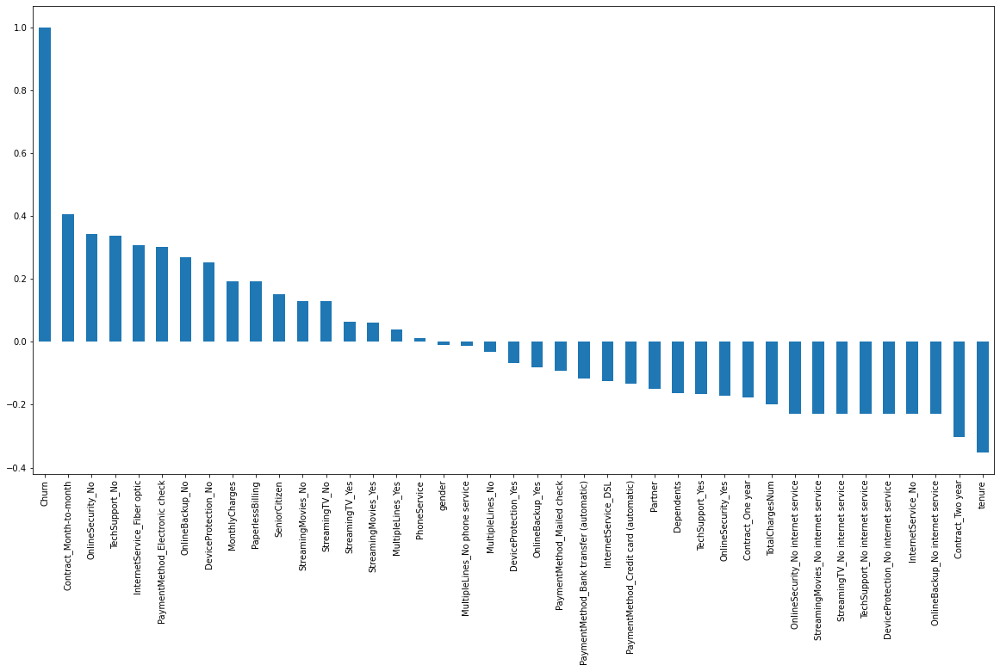

In [759]:
plt.figure(figsize=(20,10))
df2.corr()['Churn'].sort_values(ascending = False).plot(kind='bar')
plt.show()

In [760]:
X_ready = df_LR.drop(["Churn"],axis=1)
y_ready = df_LR["Churn"]

In [761]:
#apply SelectKBest class
bestfeatures = SelectKBest(score_func=chi2, k=6)
fit = bestfeatures.fit(X_ready,y_ready)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_ready.columns)

#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

Specs          Score
8                  TotalChargesNum  624292.003004
4                           tenure   16278.923685
7                   MonthlyCharges    3680.787699
33         Contract_Month-to-month     519.895311
35               Contract_Two year     488.578090
38  PaymentMethod_Electronic check     426.422767
15               OnlineSecurity_No     416.182917
24                  TechSupport_No     406.117093
13     InternetService_Fiber optic     374.476216
14              InternetService_No     286.520193


In [762]:
model = ExtraTreesClassifier()
model.fit(X_ready,y_ready)
print(model.feature_importances_)

[0.03802294 0.02644834 0.03078682 0.02505351 0.13208021 0.00414684
 0.03091125 0.11895793 0.14027046 0.01508855 0.00411256 0.01496576
 0.01343992 0.02564847 0.00154941 0.0323837  0.00373892 0.01202796
 0.01745146 0.00235716 0.01313815 0.0189065  0.00250495 0.01332644
 0.03454316 0.00247361 0.01322158 0.0131206  0.00122148 0.01298816
 0.01304598 0.00157981 0.01340462 0.05625209 0.01295374 0.0193411
 0.01348196 0.01476381 0.02856289 0.01172718]


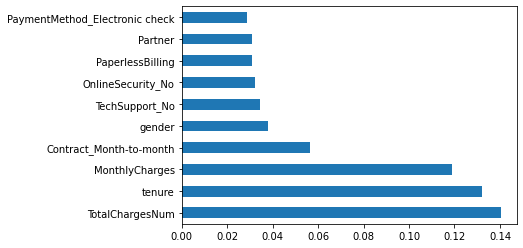

In [763]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X_ready.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()
# feat_importances

- dari hasil correlation di atas kita mencoba feature selection yang hanya berkorelasi positif

In [764]:
xsel = df2[["TotalChargesNum","tenure","MonthlyCharges","Contract_Month-to-month","Contract_Two year","PaymentMethod_Electronic check","OnlineSecurity_No","TechSupport_No","InternetService_Fiber optic","InternetService_No","gender"]]
ysel = df2["Churn"]

In [765]:
xa_train, xa_test, ya_train, ya_test = train_test_split(xsel, ysel, test_size = 0.1, random_state = 0)

xb_train, xb_test, yb_train, yb_test = train_test_split(xsel, ysel, test_size = 0.2, random_state = 0)

In [766]:
modelsel = LogisticRegression()
modelselb = LogisticRegression()
modelsel.fit(xa_train,ya_train)
modelselb.fit(xb_train,yb_train)

LogisticRegression()

In [767]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelsel, xa_train, ya_train, cv=10)
print(clf_score)
clf_score.mean()

[0.80599369 0.79968454 0.80599369 0.79179811 0.79810726 0.80914826
 0.7807571  0.78391167 0.79620853 0.81674566]


0.7988348508180464

In [768]:
y_predsel = modelsel.predict(xa_test)
y_predselb = modelselb.predict(xb_test)

In [769]:
confusion_matrix(ya_test,y_predsel)

array([[476,  49],
       [100,  80]])

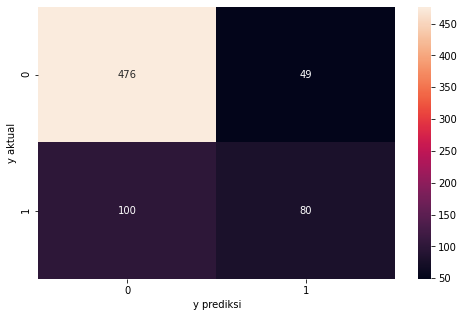

In [770]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(ya_test,y_predsel),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

#### Feature Selection LogReg Train 90 test 10 Tanpa Scalling

In [771]:
print(classification_report(ya_test,y_predsel))

precision    recall  f1-score   support

           0       0.83      0.91      0.86       525
           1       0.62      0.44      0.52       180

    accuracy                           0.79       705
   macro avg       0.72      0.68      0.69       705
weighted avg       0.77      0.79      0.78       705



In [772]:
pd.DataFrame(data = [accuracy_score(ya_test, y_predsel)*100, recall_score(ya_test, y_predsel)*100,
                    precision_score(ya_test, y_predsel)*100, roc_auc_score(ya_test, y_predsel)*100,
                    f1_score(ya_test, y_predsel)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,78.865248
recall,44.444444
precision,62.015504
roc_auc_score,67.555556
f1_score,51.779935


In [773]:
pd.DataFrame(data= [modelsel.score(xa_train,ya_train)*100,modelsel.score(xa_test,ya_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,79.977911
Model Score in data Test,78.865248


#### Feature Selection LogReg Train 80 test 20 Tanpa Scalling

In [774]:
modelselb.fit(xb_train,yb_train)

LogisticRegression()

In [775]:
y_predselb = modelselb.predict(xb_test)

In [776]:
confusion_matrix(yb_test,y_predselb)

array([[939, 102],
       [186, 182]])

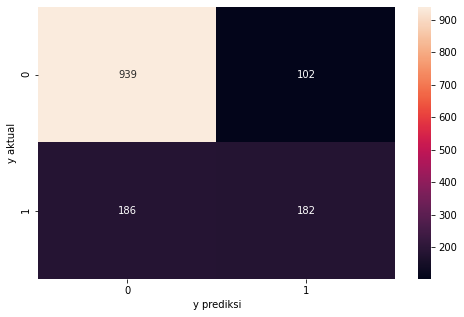

In [777]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yb_test,y_predselb),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [778]:
print(classification_report(yb_test,y_predselb))

precision    recall  f1-score   support

           0       0.83      0.90      0.87      1041
           1       0.64      0.49      0.56       368

    accuracy                           0.80      1409
   macro avg       0.74      0.70      0.71      1409
weighted avg       0.78      0.80      0.79      1409



In [779]:
pd.DataFrame(data = [accuracy_score(yb_test, y_predselb)*100, recall_score(yb_test, y_predselb)*100,
                    precision_score(yb_test, y_predselb)*100, roc_auc_score(yb_test, y_predselb)*100,
                    f1_score(yb_test, y_predselb)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.559972
recall,49.456522
precision,64.084507
roc_auc_score,69.829125
f1_score,55.828221


In [780]:
pd.DataFrame(data= [modelsel.score(xb_train,yb_train)*100,modelsel.score(xb_test,yb_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,79.943202
Model Score in data Test,79.559972


## Test Logreg dengan scalling

In [781]:
df2_Scal = df2.copy()

In [782]:
scaler = MinMaxScaler(feature_range=(0, 5))
Churn_col = list(df2_Scal.columns)
Churn_col.remove("Churn")
for col in Churn_col:
    df2_Scal[col] = df2_Scal[col].astype(float)
    df2_Scal[[col]] = scaler.fit_transform(df2_Scal[[col]])
df2_Scal["Churn"] = pd.to_numeric(df2_Scal["Churn"], downcast='float')
df2_Scal

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,Churn,TotalChargesNum,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0.0,0.0,5.0,0.0,0.069444,0.0,5.0,0.577114,0.0,0.017185,0.0,5.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0
1,5.0,0.0,0.0,0.0,2.361111,5.0,0.0,1.925373,0.0,1.087820,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0
2,5.0,0.0,0.0,0.0,0.138889,5.0,5.0,1.771144,1.0,0.062264,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,5.0
3,5.0,0.0,0.0,0.0,3.125000,0.0,0.0,1.196517,0.0,1.059754,0.0,5.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,5.0,0.0,5.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.138889,5.0,5.0,2.609453,1.0,0.087308,5.0,0.0,0.0,0.0,5.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,5.0,0.0,5.0,5.0,1.666667,5.0,5.0,3.310945,0.0,1.145968,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0
7039,0.0,0.0,5.0,5.0,5.000000,5.0,5.0,4.226368,0.0,4.238958,0.0,0.0,5.0,0.0,5.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0
7040,0.0,0.0,5.0,5.0,0.763889,0.0,5.0,0.564677,0.0,0.199458,0.0,5.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,5.0,0.0
7041,5.0,5.0,5.0,0.0,0.277778,5.0,5.0,2.793532,1.0,0.176515,0.0,0.0,5.0,0.0,5.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,5.0


In [783]:
x_LR_Scal = df2_Scal.drop(["Churn"],axis=1)
y_LR_Scal = df2_Scal["Churn"]



In [784]:
# #Scalling All feature Train/Test
xLRScal_train, xLRScal_test, yLRScal_train, yLRScal_test = train_test_split(x_LR_Scal, y_LR_Scal, test_size = 0.1, random_state = 0)
xLRScal1_train, xLRScal1_test, yLRScal1_train, yLRScal1_test = train_test_split(x_LR_Scal, y_LR_Scal, test_size = 0.2, random_state = 0)



#Scalling model all feature
modelLRScal = LogisticRegression()
modelLRScal1 = LogisticRegression()



#Fitting model scalling all feature 
modelLRScal.fit(xLRScal_train,yLRScal_train)
modelLRScal1.fit(xLRScal1_train,yLRScal1_train)


LogisticRegression()

In [785]:
y_predLRScal = modelLRScal.predict(xLRScal_test)
y_predLRScal1 = modelLRScal1.predict(xLRScal1_test)


In [786]:
confusion_matrix(yLRScal_test,y_predLRScal)

array([[472,  53],
       [ 89,  91]])

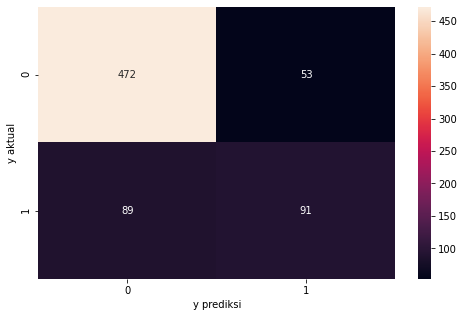

In [787]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal_test,y_predLRScal),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [788]:
# confusion_matrix(yLRScal1_test,y_predLRScal1)

#### Test LogReg with Scalling 90 semua feature

In [789]:
print(classification_report(yLRScal_test,y_predLRScal))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87       525
         1.0       0.63      0.51      0.56       180

    accuracy                           0.80       705
   macro avg       0.74      0.70      0.72       705
weighted avg       0.79      0.80      0.79       705



In [790]:
pd.DataFrame(data = [accuracy_score(yLRScal_test, y_predLRScal)*100, recall_score(yLRScal_test, y_predLRScal)*100,
                    precision_score(yLRScal_test, y_predLRScal)*100, roc_auc_score(yLRScal_test, y_predLRScal)*100,
                    f1_score(yLRScal_test, y_predLRScal)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])
            

,Score (%)
accuracy,79.858156
recall,50.555556
precision,63.194444
roc_auc_score,70.230159
f1_score,56.172840


In [791]:
pd.DataFrame(data= [modelLRScal.score(xLRScal_train,yLRScal_train)*100,modelLRScal.score(xLRScal_test,yLRScal_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.735248
Model Score in data Test,79.858156


#### Test LogReg with Scalling 80 Semua feature

In [792]:
confusion_matrix(yLRScal1_test,y_predLRScal1)

array([[932, 109],
       [175, 193]])

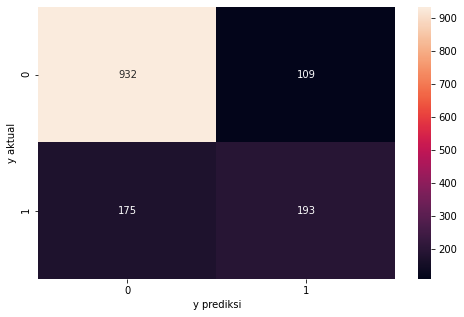

In [793]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal1_test,y_predLRScal1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [794]:
print(classification_report(yLRScal1_test,y_predLRScal1))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.58       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [795]:
pd.DataFrame(data = [accuracy_score(yLRScal1_test, y_predLRScal1)*100, recall_score(yLRScal1_test, y_predLRScal1)*100,
                    precision_score(yLRScal1_test, y_predLRScal1)*100, roc_auc_score(yLRScal1_test, y_predLRScal1)*100,
                    f1_score(yLRScal1_test, y_predLRScal1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.843861
recall,52.445652
precision,63.907285
roc_auc_score,70.987475
f1_score,57.611940


In [796]:
pd.DataFrame(data= [modelLRScal1.score(xLRScal1_train,yLRScal1_train)*100,modelLRScal1.score(xLRScal1_test,yLRScal1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.812922
Model Score in data Test,79.843861


#### Scalling Param Tuning Random Search

#### Scalling Param Tuning Random Search Train 90

In [797]:
model_LogReg_RS_Scal = LogisticRegression(solver='lbfgs', penalty = 'none', max_iter = 1000)
model_LogReg_RS_Scal.fit(xLRScal_train, yLRScal_train)

LogisticRegression(max_iter=1000, penalty='none')

In [798]:
y_pred_LR_RSScal = model_LogReg_RS_Scal.predict(xLRScal_test)

In [799]:
confusion_matrix(yLRScal_test,y_pred_LR_RSScal)

array([[473,  52],
       [ 90,  90]])

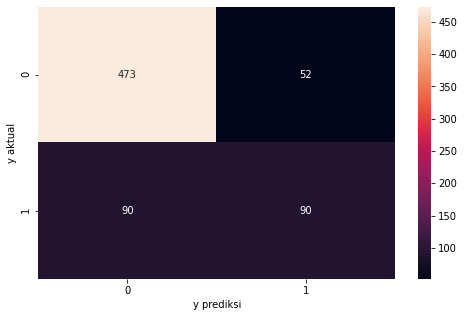

In [800]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal_test,y_pred_LR_RSScal),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [801]:
print(classification_report(yLRScal_test,y_pred_LR_RSScal))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87       525
         1.0       0.63      0.50      0.56       180

    accuracy                           0.80       705
   macro avg       0.74      0.70      0.71       705
weighted avg       0.79      0.80      0.79       705



In [802]:
pd.DataFrame(data = [accuracy_score(yLRScal_test, y_pred_LR_RSScal)*100, recall_score(yLRScal_test, y_pred_LR_RSScal)*100,
                    precision_score(yLRScal_test, y_pred_LR_RSScal)*100, roc_auc_score(yLRScal_test, y_pred_LR_RSScal)*100,
                    f1_score(yLRScal_test, y_pred_LR_RSScal)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.858156
recall,50.000000
precision,63.380282
roc_auc_score,70.047619
f1_score,55.900621


In [803]:
pd.DataFrame(data= [model_LogReg_RS_Scal.score(xLRScal_train,yLRScal_train)*100,model_LogReg_RS_Scal.score(xLRScal_test,yLRScal_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.798359
Model Score in data Test,79.858156


#### Scalling Param Tuning RS Train 80 test 20

In [804]:
model_LogReg_RS_Scal1 = LogisticRegression(solver='lbfgs', penalty = 'l2', max_iter = 1000)
model_LogReg_RS_Scal1.fit(xLRScal1_train, yLRScal1_train)

LogisticRegression(max_iter=1000)

In [805]:
y_pred_LR_RSScal1 = model_LogReg_RS_Scal1.predict(xLRScal1_test)

In [806]:
confusion_matrix(yLRScal1_test,y_pred_LR_RSScal1)

array([[932, 109],
       [175, 193]])

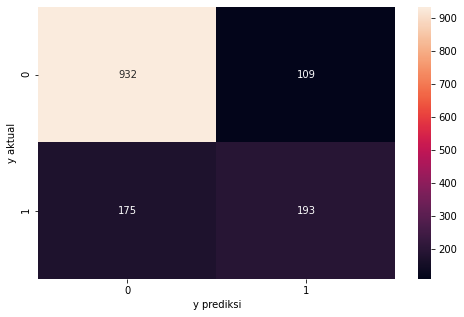

In [807]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal1_test,y_pred_LR_RSScal1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [808]:
print(classification_report(yLRScal1_test,y_pred_LR_RSScal1))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.58       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [809]:
pd.DataFrame(data = [accuracy_score(yLRScal1_test, y_pred_LR_RSScal1)*100, recall_score(yLRScal1_test, y_pred_LR_RSScal1)*100,
                    precision_score(yLRScal1_test, y_pred_LR_RSScal1)*100, roc_auc_score(yLRScal1_test, y_pred_LR_RSScal1)*100,
                    f1_score(yLRScal1_test, y_pred_LR_RSScal1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.843861
recall,52.445652
precision,63.907285
roc_auc_score,70.987475
f1_score,57.611940


In [810]:
pd.DataFrame(data= [model_LogReg_RS_Scal1.score(xLRScal1_train,yLRScal1_train)*100,model_LogReg_RS_Scal1.score(xLRScal1_test,yLRScal1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.812922
Model Score in data Test,79.843861


#### Scalling Param Tuning Grid Search

In [811]:
model_LogReg_GSScal = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GSScal.fit(xLRScal_train, yLRScal_train)

model_LogReg_GSScal1 = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GSScal1.fit(xLRScal1_train, yLRScal1_train)

LogisticRegression(solver='newton-cg')

#### Scalling Param Tuning GS Train 90 test 10

In [812]:
y_pred_LR_GSScal = model_LogReg_GSScal.predict(xLRScal_test)

In [813]:
confusion_matrix(yLRScal_test,y_pred_LR_GSScal)

array([[472,  53],
       [ 89,  91]])

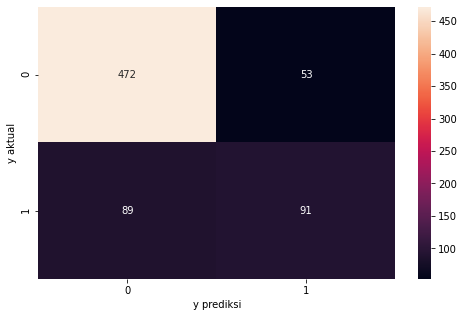

In [814]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal_test,y_pred_LR_GSScal),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [815]:
print(classification_report(yLRScal_test,y_pred_LR_GSScal))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87       525
         1.0       0.63      0.51      0.56       180

    accuracy                           0.80       705
   macro avg       0.74      0.70      0.72       705
weighted avg       0.79      0.80      0.79       705



In [816]:
pd.DataFrame(data = [accuracy_score(yLRScal_test, y_pred_LR_GSScal)*100, recall_score(yLRScal_test, y_pred_LR_GSScal)*100,
                    precision_score(yLRScal_test, y_pred_LR_GSScal)*100, roc_auc_score(yLRScal_test, y_pred_LR_GSScal)*100,
                    f1_score(yLRScal_test, y_pred_LR_GSScal)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.858156
recall,50.555556
precision,63.194444
roc_auc_score,70.230159
f1_score,56.172840


In [817]:
pd.DataFrame(data= [model_LogReg_GSScal.score(xLRScal_train,yLRScal_train)*100,model_LogReg_GSScal.score(xLRScal_test,yLRScal_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.735248
Model Score in data Test,79.858156


#### Scalling Param Tuning GS Train 80 test 20

In [818]:
y_pred_LR_GSScal1 = model_LogReg_GSScal1.predict(xLRScal1_test)

In [819]:
confusion_matrix(yLRScal1_test,y_pred_LR_GSScal1)

array([[932, 109],
       [175, 193]])

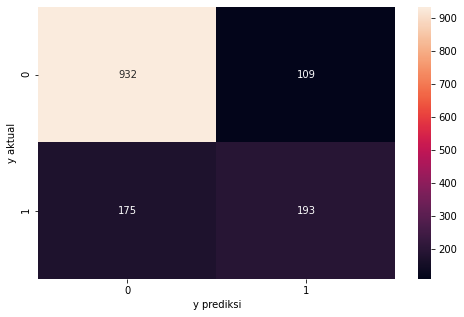

In [820]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScal1_test,y_pred_LR_GSScal1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [821]:
print(classification_report(yLRScal1_test,y_pred_LR_GSScal1))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.58       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [822]:
pd.DataFrame(data = [accuracy_score(yLRScal1_test, y_pred_LR_GSScal1)*100, recall_score(yLRScal1_test, y_pred_LR_GSScal1)*100,
                    precision_score(yLRScal1_test, y_pred_LR_GSScal1)*100, roc_auc_score(yLRScal1_test, y_pred_LR_GSScal1)*100,
                    f1_score(yLRScal1_test, y_pred_LR_GSScal1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.843861
recall,52.445652
precision,63.907285
roc_auc_score,70.987475
f1_score,57.611940


In [823]:
pd.DataFrame(data= [model_LogReg_GSScal.score(xLRScal1_train,yLRScal1_train)*100,model_LogReg_GSScal.score(xLRScal1_test,yLRScal1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,80.795172
Model Score in data Test,80.056778


### Test Model Scalling with feature selection No Tuning

In [824]:
x_LR_Scalsel = df2_Scal[["TotalChargesNum","tenure","MonthlyCharges","Contract_Month-to-month","Contract_Two year","PaymentMethod_Electronic check","OnlineSecurity_No","TechSupport_No","InternetService_Fiber optic","InternetService_No","gender"]]
y_LR_Scalsel = df2_Scal["Churn"]


In [825]:
#Scalling feature selection Train/Test
xLRScalsel_train, xLRScalsel_test, yLRScalsel_train, yLRScalsel_test = train_test_split(x_LR_Scalsel, y_LR_Scalsel, test_size = 0.1, random_state = 0)
xLRScalselb_train, xLRScalselb_test, yLRScalselb_train, yLRScalselb_test = train_test_split(x_LR_Scalsel, y_LR_Scalsel, test_size = 0.2, random_state = 0)

In [826]:
#Scalling model feature selection
modelLRScalsela = LogisticRegression()

#Fitting model scalling  feature selection
modelLRScalsela.fit(xLRScalsel_train,yLRScalsel_train)


LogisticRegression()

In [827]:
modelLRScalselb = LogisticRegression()
modelLRScalselb.fit(xLRScalselb_train,yLRScalselb_train)

LogisticRegression()

In [828]:
'''Train 90 Test 10'''

y_pred_LR_Scalsela = modelLRScalsela.predict(xLRScalsel_test)


In [829]:
print(classification_report(yLRScalsel_test,y_pred_LR_Scalsela))

precision    recall  f1-score   support

         0.0       0.83      0.90      0.86       525
         1.0       0.62      0.47      0.53       180

    accuracy                           0.79       705
   macro avg       0.72      0.69      0.70       705
weighted avg       0.78      0.79      0.78       705



In [830]:
pd.DataFrame(data = [accuracy_score(yLRScalsel_test, y_pred_LR_Scalsela)*100, recall_score(yLRScalsel_test, y_pred_LR_Scalsela)*100,
                    precision_score(yLRScalsel_test, y_pred_LR_Scalsela)*100, roc_auc_score(yLRScalsel_test, y_pred_LR_Scalsela)*100,
                    f1_score(yLRScalsel_test, y_pred_LR_Scalsela)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.007092
recall,47.222222
precision,61.594203
roc_auc_score,68.563492
f1_score,53.459119


In [831]:
'''Train 80 Test 10'''

'Train 80 Test 10'

In [832]:
y_pred_LR_Scalselb = modelLRScalselb.predict(xLRScalselb_test)


In [833]:
print(classification_report(yLRScalselb_test,y_pred_LR_Scalselb))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.57       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [834]:
pd.DataFrame(data = [accuracy_score(yLRScalselb_test, y_pred_LR_Scalselb)*100, recall_score(yLRScalselb_test, y_pred_LR_Scalselb)*100,
                    precision_score(yLRScalselb_test, y_pred_LR_Scalselb)*100, roc_auc_score(yLRScalselb_test, y_pred_LR_Scalselb)*100,
                    f1_score(yLRScalselb_test, y_pred_LR_Scalselb)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.772889
recall,51.902174
precision,63.879599
roc_auc_score,70.763767
f1_score,57.271364


### Test Model Scalling with feature selection With Tuning

In [835]:
x_LR_Scalseltun = df2_Scal[["TotalChargesNum","tenure","MonthlyCharges","Contract_Month-to-month","Contract_Two year","PaymentMethod_Electronic check","OnlineSecurity_No","TechSupport_No","InternetService_Fiber optic","InternetService_No","gender"]]
y_LR_Scalseltun = df2_Scal["Churn"]

In [836]:
xLRScalseltun_train, xLRScalseltun_test, yLRScalseltun_train, yLRScalseltun_test = train_test_split(x_LR_Scalseltun, y_LR_Scalseltun, test_size = 0.1, random_state = 0)

In [837]:
xLRScalseltunb_train, xLRScalseltunb_test, yLRScalseltunb_train, yLRScalseltunb_test = train_test_split(x_LR_Scalseltun, y_LR_Scalseltun, test_size = 0.2, random_state = 0)

In [838]:
# model_LogReg_RS_Scalseltun = LogisticRegression(solver='lbfgs', penalty = 'l2', max_iter = 1000)
# model_LogReg_RS_Scalseltun.fit(xLRScalseltun_train, yLRScalseltun_train)
model_LR_RSScalseltun = LogisticRegression(solver='lbfgs', penalty= 'l2',max_iter=1000)
model_LR_RSScalseltun.fit(xLRScalseltun_train,yLRScalseltun_train)

LogisticRegression(max_iter=1000)

In [839]:
model_LogReg_RS_Scalseltunb = LogisticRegression(solver='lbfgs', penalty = 'l2', max_iter = 1000)
model_LogReg_RS_Scalseltunb.fit(xLRScalseltunb_train, yLRScalseltunb_train)

LogisticRegression(max_iter=1000)

In [840]:
y_pred_LR_RSScalseltun = model_LogReg_RS_Scalseltunb.predict(xLRScalsel_test)


In [841]:
confusion_matrix(yLRScalseltun_test,y_pred_LR_RSScalseltun)

array([[472,  53],
       [ 95,  85]])

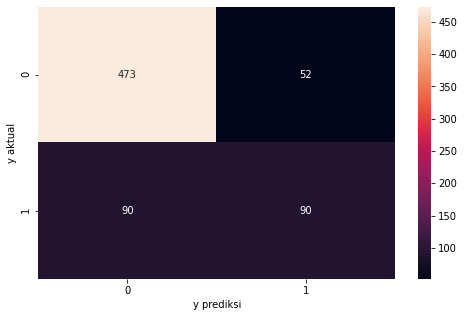

In [842]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yLRScalseltun_test,y_pred_LR_RSScal),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [843]:
print(classification_report(yLRScalsel_test,y_pred_LR_RSScalseltun))

precision    recall  f1-score   support

         0.0       0.83      0.90      0.86       525
         1.0       0.62      0.47      0.53       180

    accuracy                           0.79       705
   macro avg       0.72      0.69      0.70       705
weighted avg       0.78      0.79      0.78       705



In [844]:
pd.DataFrame(data = [accuracy_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100, recall_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100,
                    precision_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100, roc_auc_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100,
                    f1_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.007092
recall,47.222222
precision,61.594203
roc_auc_score,68.563492
f1_score,53.459119


In [845]:
y_pred_LR_RSScalseltunb = model_LogReg_RS_Scalseltunb.predict(xLRScalseltunb_test)


In [846]:
print(classification_report(yLRScalseltunb_test,y_pred_LR_RSScalseltunb))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.57       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [847]:
pd.DataFrame(data = [accuracy_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100, recall_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100,
                    precision_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100, roc_auc_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100,
                    f1_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.772889
recall,51.902174
precision,63.879599
roc_auc_score,70.763767
f1_score,57.271364


In [848]:
model_LogReg_GSScalsel = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GSScalsel.fit(xLRScalseltun_train, yLRScalseltun_train)

LogisticRegression(solver='newton-cg')

### Logreg Feature Selection with Scalling Param tuning GS Train 90

In [849]:
y_pred_LR_GSScalsel = model_LogReg_GSScalsel.predict(xLRScalseltun_test)


In [850]:
print(classification_report(yLRScalseltun_test,y_pred_LR_GSScalsel))

precision    recall  f1-score   support

         0.0       0.83      0.90      0.86       525
         1.0       0.62      0.47      0.53       180

    accuracy                           0.79       705
   macro avg       0.72      0.69      0.70       705
weighted avg       0.78      0.79      0.78       705



In [851]:
pd.DataFrame(data = [accuracy_score(yLRScalseltun_test, y_pred_LR_GSScalsel)*100, recall_score(yLRScalseltun_test, y_pred_LR_GSScalsel)*100,
                    precision_score(yLRScalseltun_test, y_pred_LR_GSScalsel)*100, roc_auc_score(yLRScalseltun_test, y_pred_LR_GSScalsel)*100,
                    f1_score(yLRScalseltun_test, y_pred_LR_GSScalsel)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.007092
recall,47.222222
precision,61.594203
roc_auc_score,68.563492
f1_score,53.459119


### Logreg Feature Selection with Scalling Param tuning GS Train 80

In [852]:
model_LogReg_GSScalsel1 = LogisticRegression(solver='newton-cg', penalty = 'l2', max_iter = 100)
model_LogReg_GSScalsel1.fit(xLRScalseltunb_train, yLRScalseltunb_train)

LogisticRegression(solver='newton-cg')

In [853]:
y_pred_LR_GSScalsel1 = model_LogReg_GSScalsel1.predict(xLRScalseltunb_test)


In [854]:
print(classification_report(yLRScalseltunb_test,y_pred_LR_GSScalsel1))

precision    recall  f1-score   support

         0.0       0.84      0.90      0.87      1041
         1.0       0.64      0.52      0.57       368

    accuracy                           0.80      1409
   macro avg       0.74      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [855]:
pd.DataFrame(data = [accuracy_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100, recall_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100,
                    precision_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100, roc_auc_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100,
                    f1_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score (%)'])

,Score (%)
accuracy,79.772889
recall,51.902174
precision,63.879599
roc_auc_score,70.763767
f1_score,57.271364


In [856]:
Logreg_Summary = pd.DataFrame({"Logistic Regression": ["accuracy","recall","precision","roc_auc_score","f1_score"],
                                "All Feature Train 90 Test 10 No Scal": [accuracy_score(yLR_test,y_predLR)*100,recall_score(yLR_test,y_predLR)*100,precision_score(yLR_test,y_predLR)*100,roc_auc_score(yLR_test,y_predLR)*100,f1_score(yLR_test,y_predLR)*100],
                                "All Feature Train 80 Test 20 No Scal":[accuracy_score(yLR1_test,y_predLR1)*100,recall_score(yLR1_test,y_predLR1)*100,precision_score(yLR1_test,y_predLR1)*100,roc_auc_score(yLR1_test,y_predLR1)*100,f1_score(yLR1_test,y_predLR1)*100],
                                "Parameter Tuning Random Search All Feature Train 90 No Scalling":[accuracy_score(yLR_test, y_pred_LR_RS)*100, recall_score(yLR_test, y_pred_LR_RS)*100,
                    precision_score(yLR_test, y_pred_LR_RS)*100, roc_auc_score(yLR_test, y_pred_LR_RS)*100,
                    f1_score(yLR_test, y_pred_LR_RS)*100],
                                "Parameter Tuning Random Search All Feature Train 80 No Scalling":[accuracy_score(yLR1_test, y_pred_LR_RS1)*100, recall_score(yLR1_test, y_pred_LR_RS1)*100,
                    precision_score(yLR1_test, y_pred_LR_RS1)*100, roc_auc_score(yLR1_test, y_pred_LR_RS1)*100,
                    f1_score(yLR1_test, y_pred_LR_RS1)*100],
                                "Parameter Tuning Grid Search All Feature Train 90 No Scalling":[accuracy_score(yLR_test, y_pred_LR_GS)*100, recall_score(yLR_test, y_pred_LR_GS)*100,
                    precision_score(yLR_test, y_pred_LR_GS)*100, roc_auc_score(yLR_test, y_pred_LR_GS)*100,
                    f1_score(yLR_test, y_pred_LR_GS)*100],
                                "Parameter Tuning Grid Search All Feature Train 80 No Scalling":[accuracy_score(yLR1_test, y_pred_LR_GS1)*100, recall_score(yLR1_test, y_pred_LR_GS1)*100,
                    precision_score(yLR1_test, y_pred_LR_GS1)*100, roc_auc_score(yLR1_test, y_pred_LR_GS1)*100,
                    f1_score(yLR1_test, y_pred_LR_GS1)*100],
                                "Param Tuning All Feature RS Train 90 With Scalling":[accuracy_score(yLRScal_test, y_predLRScal)*100, recall_score(yLRScal_test, y_predLRScal)*100,
                    precision_score(yLRScal_test, y_predLRScal)*100, roc_auc_score(yLRScal_test, y_predLRScal)*100,
                    f1_score(yLRScal_test, y_predLRScal)*100],
                                "Param Tuning All Feature RS Train 80 With Scalling": [accuracy_score(yLRScal1_test, y_pred_LR_RSScal1)*100, recall_score(yLRScal1_test, y_pred_LR_RSScal1)*100,
                    precision_score(yLRScal1_test, y_pred_LR_RSScal1)*100, roc_auc_score(yLRScal1_test, y_pred_LR_RSScal1)*100,
                    f1_score(yLRScal1_test, y_pred_LR_RSScal1)*100],
                                "Feature Selection LogReg Train 90 test 10 Tanpa Scalling ": [accuracy_score(ya_test, y_predsel)*100, recall_score(ya_test, y_predsel)*100,
                    precision_score(ya_test, y_predsel)*100, roc_auc_score(ya_test, y_predsel)*100,
                    f1_score(ya_test, y_predsel)*100],
                                 "Feature Selection LogReg Train 80 test 20 Tanpa Scalling ": [accuracy_score(yb_test, y_predselb)*100, recall_score(yb_test, y_predselb)*100,
                    precision_score(yb_test, y_predselb)*100, roc_auc_score(yb_test, y_predselb)*100,
                    f1_score(yb_test, y_predselb)*100],
                    "Test Model Scalling with feature selection No Tuning Train 90": [accuracy_score(yLRScalsel_test, y_pred_LR_Scalsela)*100, recall_score(yLRScalsel_test, y_pred_LR_Scalsela)*100,
                    precision_score(yLRScalsel_test, y_pred_LR_Scalsela)*100, roc_auc_score(yLRScalsel_test, y_pred_LR_Scalsela)*100,
                    f1_score(yLRScalsel_test, y_pred_LR_Scalsela)*100],
                    "Test Model Scalling with feature selection No Tuning Train 80": [accuracy_score(yLRScalselb_test, y_pred_LR_Scalselb)*100, recall_score(yLRScalselb_test, y_pred_LR_Scalselb)*100,
                    precision_score(yLRScalselb_test, y_pred_LR_Scalselb)*100, roc_auc_score(yLRScalselb_test, y_pred_LR_Scalselb)*100,
                    f1_score(yLRScalselb_test, y_pred_LR_Scalselb)*100],
                    "Test Model Scalling with feature selection With Tuning RS Train 90": [accuracy_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100, recall_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100,
                    precision_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100, roc_auc_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100,
                    f1_score(yLRScalseltun_test, y_pred_LR_RSScalseltun)*100],
                     "Test Model Scalling with feature selection With Tuning RS Train 80": [accuracy_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100, recall_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100,
                    precision_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100, roc_auc_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100,
                    f1_score(yLRScalseltunb_test, y_pred_LR_RSScalseltunb)*100],
                    "Test Model Scalling with feature selection With Tuning GS Train 90":[accuracy_score(yLRScalsel_test, y_pred_LR_GSScalsel)*100, recall_score(yLRScalsel_test, y_pred_LR_GSScalsel)*100,
                    precision_score(yLRScalsel_test, y_pred_LR_GSScalsel)*100, roc_auc_score(yLRScalsel_test, y_pred_LR_GSScalsel)*100,
                    f1_score(yLRScalsel_test, y_pred_LR_GSScalsel)*100],
                     "Test Model Scalling with feature selection With Tuning GS Train 80": [accuracy_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100, recall_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100,
                    precision_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100, roc_auc_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100,
                    f1_score(yLRScalseltunb_test, y_pred_LR_GSScalsel1)*100]
                              

})
a = Logreg_Summary.set_index("Logistic Regression").T
a

Logistic Regression,accuracy,recall,precision,roc_auc_score,f1_score
All Feature Train 90 Test 10 No Scal,79.716312,51.111111,62.585034,70.317460,56.269113
All Feature Train 80 Test 20 No Scal,79.701916,51.358696,63.851351,70.540059,56.927711
Parameter Tuning Random Search All Feature Train 90 No Scalling,79.716312,51.111111,62.585034,70.317460,56.269113
Parameter Tuning Random Search All Feature Train 80 No Scalling,79.843861,52.717391,63.815789,71.075314,57.738095
Parameter Tuning Grid Search All Feature Train 90 No Scalling,79.574468,50.555556,62.328767,70.039683,55.828221
Parameter Tuning Grid Search All Feature Train 80 No Scalling,79.772889,52.445652,63.696370,70.939445,57.526080
Param Tuning All Feature RS Train 90 With Scalling,79.858156,50.555556,63.194444,70.230159,56.172840
Param Tuning All Feature RS Train 80 With Scalling,79.843861,52.445652,63.907285,70.987475,57.611940
Feature Selection LogReg Train 90 test 10 Tanpa Scalling,78.865248,44.444444,62.015504,67.555556,51.779935
Feature Selection LogReg Train 80 test 20 Tanpa Scalling,79.559972,49.456522,64.084507,69.829125,55.828221


## Overall Model Test Terbaik Logistic Regression Pada Kondisi All Feature With ParameterTuning Random Search CV Tanpa Scalling Data Train 80 Test 20

In [857]:
Logreg_BestTest = pd.DataFrame({"Logistic Regression Best Test Condition": ["accuracy","recall","precision","roc_auc_score","f1_score"],"Parameter Tuning All Feature RS Train 90 With Scalling":[accuracy_score(yLRScal_test, y_predLRScal)*100, recall_score(yLRScal_test, y_predLRScal)*100,
                    precision_score(yLRScal_test, y_predLRScal)*100, roc_auc_score(yLRScal_test, y_predLRScal)*100,
                    f1_score(yLRScal_test, y_predLRScal)*100]})
Logreg_BestTest.set_index("Logistic Regression Best Test Condition").T


Logistic Regression Best Test Condition,accuracy,recall,precision,roc_auc_score,f1_score
Parameter Tuning All Feature RS Train 90 With Scalling,79.858156,50.555556,63.194444,70.230159,56.17284


<hr>
<hr>

# Decision Tree

In [858]:
df_DT = df2.copy()

In [859]:
x_DT = df_DT.drop(["Churn"],axis=1)
y_DT = df_DT["Churn"]

### Test Model Decision Tree All feature No Scalling No Parameter tuning Train 90 Test 10

In [860]:
xDT_train, xDT_test, yDT_train, yDT_test = train_test_split(x_DT, y_DT, test_size = 0.1, random_state = 0)

In [861]:
modelDT = DecisionTreeClassifier()

modelDT.fit(xDT_train,yDT_train)

DecisionTreeClassifier()

In [862]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDT, xDT_train, yDT_train, cv=10)
print(clf_score)
clf_score.mean()

[0.7444795  0.72870662 0.75078864 0.71608833 0.77444795 0.72082019
 0.67350158 0.72397476 0.71879937 0.72985782]


0.7281464758971599

### Test Model Decision Tree All feature No Scalling No Parameter tuning Train 90 Test 10

In [863]:
y_predDT = modelDT.predict(xDT_test)

= 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(374.47634756995586, 302.0000000000001, 'X[8] <= 44.35\ngini = 0.482\nsamples = 32\nvalue = [19, 13]'),
 Text(370.0057731958763, 261.73333333333335, 'X[36] <= 0.5\ngini = 0.426\nsamples = 13\nvalue = [9, 4]'),
 Text(368.9538733431517, 221.4666666666667, 'X[8] <= 25.0\ngini = 0.494\nsamples = 9\nvalue = [5, 4]'),
 Text(367.9019734904271, 181.20000000000005, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(370.0057731958763, 181.20000000000005, 'X[8] <= 25.125\ngini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(368.9538733431517, 140.9333333333334, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(371.0576730486009, 140.9333333333334, 'X[6] <= 0.5\ngini = 0.49\nsamples = 7\nvalue = [4, 3]'),
 Text(368.9538733431517, 100.66666666666674, 'X[0] <= 0.5\ngini = 0.444\nsamples = 3\nvalue = [1, 2]'),
 Text(367.9019734904271, 60.40000000000009, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(370.0057731958763, 60.40000000000009, 'gini = 0.0\nsamples = 

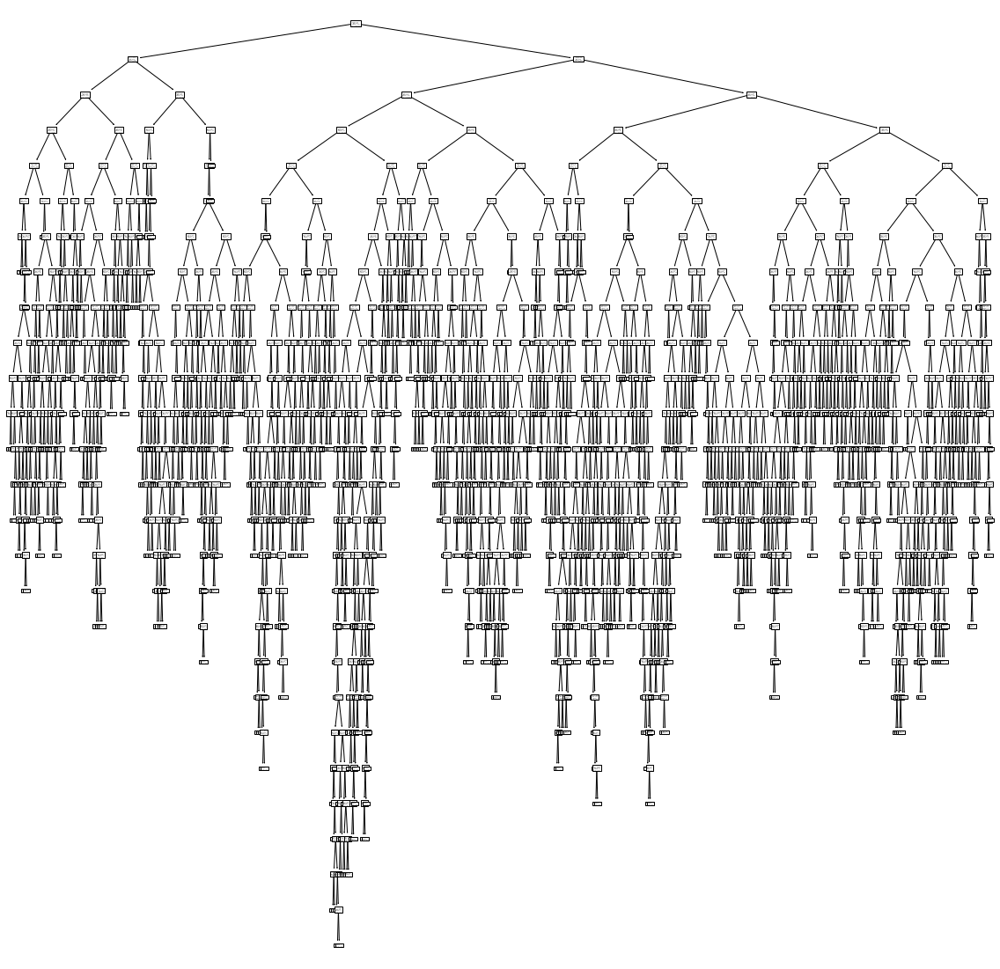

In [864]:
plt.figure(figsize=(20, 20))
tree.plot_tree(modelDT.fit(xDT_train, yDT_train))
# plt.show()

In [865]:
# DT_columns = xDT_train.columns.tolist()
# class_name = ['Churn', 'No Churn']

In [866]:
# tree.export_graphviz(
#     modelDT.fit(xDT_train, yDT_train),
#     out_file = 'decision.dot',
#     feature_names = DT_columns,
#     class_names = class_name
# # )

In [867]:
confusion_matrix(yDT_test,y_predDT)

array([[416, 109],
       [ 87,  93]])

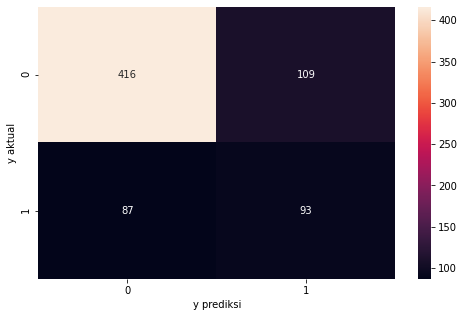

In [868]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yDT_test,y_predDT),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [869]:
print(classification_report(yDT_test,y_predDT))

precision    recall  f1-score   support

           0       0.83      0.79      0.81       525
           1       0.46      0.52      0.49       180

    accuracy                           0.72       705
   macro avg       0.64      0.65      0.65       705
weighted avg       0.73      0.72      0.73       705



In [870]:
pd.DataFrame(data= [accuracy_score(yDT_test,y_predDT)*100,recall_score(yDT_test,y_predDT)*100,precision_score(yDT_test,y_predDT)*100,roc_auc_score(yDT_test,y_predDT)*100,f1_score(yDT_test,y_predDT)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,72.198582
recall,51.666667
precission,46.039604
roc_auc_score,65.452381
F1 Score,48.691099


In [871]:
pd.DataFrame(data= [modelDT.score(xDT_train,yDT_train)*100,modelDT.score(xDT_test,yDT_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,99.763332
Model Score in data Test,73.333333


### Test Model Decision Tree All feature No Scalling No Parameter tuning Train 80 Test 20

In [872]:
xDT1_train, xDT1_test, yDT1_train, yDT1_test = train_test_split(x_DT, y_DT, test_size = 0.2, random_state = 0)

In [873]:
modelDT1 = DecisionTreeClassifier()

modelDT1.fit(xDT1_train,yDT1_train)

DecisionTreeClassifier()

In [874]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDT1, xDT1_train, yDT1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.7393617  0.74113475 0.72695035 0.7429078  0.71580817 0.74067496
 0.72291297 0.73712256 0.72824156 0.72291297]


0.731802778932517

In [875]:
y_predDT1 = modelDT1.predict(xDT1_test)

In [876]:
confusion_matrix(yDT1_test,y_predDT1)

array([[836, 205],
       [178, 190]])

In [877]:
print(classification_report(yDT1_test,y_predDT1))

precision    recall  f1-score   support

           0       0.82      0.80      0.81      1041
           1       0.48      0.52      0.50       368

    accuracy                           0.73      1409
   macro avg       0.65      0.66      0.66      1409
weighted avg       0.73      0.73      0.73      1409



In [878]:
pd.DataFrame(data= [accuracy_score(yDT1_test,y_predDT1)*100,recall_score(yDT1_test,y_predDT1)*100,precision_score(yDT1_test,y_predDT1)*100,roc_auc_score(yDT1_test,y_predDT1)*100,f1_score(yDT1_test,y_predDT1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,72.817601
recall,51.630435
precission,48.101266
roc_auc_score,65.968916
F1 Score,49.803408


In [879]:
pd.DataFrame(data= [modelDT1.score(xDT1_train,yDT1_train)*100,modelDT1.score(xDT1_test,yDT1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,99.751509
Model Score in data Test,72.817601


### Test Model Decision Tree All feature No Scalling With Parameter tuning Random Search Train 90 Test 10

In [880]:
# criterion = ['gini', 'entropy']
# max_depth = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None]
# min_samples_leaf = [1, 2, 4]
# min_samples_split = [2, 5, 10]

# param_DTC = {
#             'criterion': criterion,
#             'max_depth': max_depth,
#             'min_samples_split': min_samples_split,
#             'min_samples_leaf': min_samples_leaf}

In [881]:
# model_DT_tun = DecisionTreeClassifier()
# model_DT_tunRS = RandomizedSearchCV(estimator = model_LR_tun, param_distributions = param_DTC, cv = 5)

In [882]:
# model_DT_tunRS.fit(xDT_train, yDT_train)
# model_DT_tunRS.best_params_

In [883]:
modelDTtun = DecisionTreeClassifier(min_samples_split=2,min_samples_leaf=4,max_depth=10,criterion="entropy")
modelDTtun.fit(xDT_train,yDT_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4)

In [884]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDT, xDT_train, yDT_train, cv=10)
print(clf_score)
clf_score.mean()

[0.74132492 0.73343849 0.7444795  0.71135647 0.7681388  0.75078864
 0.67350158 0.71766562 0.7235387  0.72195893]


0.7286191636640903

In [885]:
y_predDTtun = modelDTtun.predict(xDT_test)

In [886]:
confusion_matrix(yDT_test,y_predDTtun)

array([[453,  72],
       [ 91,  89]])

In [887]:
print(classification_report(yDT_test,y_predDTtun))

precision    recall  f1-score   support

           0       0.83      0.86      0.85       525
           1       0.55      0.49      0.52       180

    accuracy                           0.77       705
   macro avg       0.69      0.68      0.68       705
weighted avg       0.76      0.77      0.76       705



In [888]:
pd.DataFrame(data= [accuracy_score(yDT_test,y_predDTtun)*100,recall_score(yDT_test,y_predDTtun)*100,precision_score(yDT_test,y_predDTtun)*100,roc_auc_score(yDT_test,y_predDTtun)*100,f1_score(yDT_test,y_predDTtun)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.879433
recall,49.444444
precission,55.279503
roc_auc_score,67.865079
F1 Score,52.199413


In [889]:
pd.DataFrame(data= [modelDTtun.score(xDT_train,yDT_train)*100,modelDTtun.score(xDT_test,yDT_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,84.395708
Model Score in data Test,76.879433


### Test Model Decision Tree All feature No Scalling With Parameter tuning Random Search Train 80 Test 20

In [890]:
y_predDTtun1 = modelDTtun.predict(xDT1_test)

In [891]:
confusion_matrix(yDT1_test,y_predDTtun1)

array([[924, 117],
       [148, 220]])

In [892]:
print(classification_report(yDT1_test,y_predDTtun1))

precision    recall  f1-score   support

           0       0.86      0.89      0.87      1041
           1       0.65      0.60      0.62       368

    accuracy                           0.81      1409
   macro avg       0.76      0.74      0.75      1409
weighted avg       0.81      0.81      0.81      1409



In [893]:
pd.DataFrame(data= [accuracy_score(yDT1_test,y_predDTtun1)*100,recall_score(yDT1_test,y_predDTtun1)*100,precision_score(yDT1_test,y_predDTtun1)*100,roc_auc_score(yDT1_test,y_predDTtun1)*100,f1_score(yDT1_test,y_predDTtun1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,81.192335
recall,59.782609
precission,65.281899
roc_auc_score,74.271708
F1 Score,62.411348


In [894]:
pd.DataFrame(data= [modelDTtun.score(xDT1_train,yDT1_train)*100,modelDTtun.score(xDT1_test,yDT1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,84.256301
Model Score in data Test,81.192335


### GRID SEARCH

In [895]:
# model_DT_tun = DecisionTreeClassifier()
# model_DT_tunGS = GridSearchCV(estimator = model_DT_tun, param_grid = param_DTC, cv = 5)

In [896]:
# model_DT_tun1 = DecisionTreeClassifier()
# model_DT_tunGS1 = GridSearchCV(estimator = model_DT_tun, param_grid = param_DTC, cv = 5)

In [897]:
# model_DT_tunGS.fit(xDT_train, yDT_train)
# model_DT_tunGS.best_params_

In [898]:
# model_DT_tunGS1.fit(xDT1_train, yDT1_train)
# model_DT_tunGS1.best_params_

### Test Model Decision Tree All feature No Scalling With Parameter tuning Grid Search Train 90 Test 10

In [899]:
modelDT_tunGS = DecisionTreeClassifier(min_samples_split=10,min_samples_leaf=4,max_depth=10,criterion="entropy")


modelDT_tunGS.fit(xDT_train,yDT_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4,
                       min_samples_split=10)

In [900]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDT_tunGS, xDT_train, yDT_train, cv=10)
print(clf_score)
clf_score.mean()

[0.76498423 0.74605678 0.80599369 0.75867508 0.77760252 0.78706625
 0.75078864 0.76182965 0.74407583 0.78199052]


0.7679063196136768

In [901]:
y_predDTtunGS = modelDT_tunGS.predict(xDT_test)

In [902]:
confusion_matrix(yDT_test,y_predDTtunGS)

array([[452,  73],
       [ 92,  88]])

In [903]:
print(classification_report(yDT_test,y_predDTtunGS))

precision    recall  f1-score   support

           0       0.83      0.86      0.85       525
           1       0.55      0.49      0.52       180

    accuracy                           0.77       705
   macro avg       0.69      0.67      0.68       705
weighted avg       0.76      0.77      0.76       705



In [904]:
pd.DataFrame(data= [accuracy_score(yDT_test,y_predDTtunGS)*100,recall_score(yDT_test,y_predDTtunGS)*100,precision_score(yDT_test,y_predDTtunGS)*100,roc_auc_score(yDT_test,y_predDTtunGS)*100,f1_score(yDT_test,y_predDTtunGS)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.595745
recall,48.888889
precission,54.658385
roc_auc_score,67.492063
F1 Score,51.612903


In [905]:
pd.DataFrame(data= [modelDT_tunGS.score(xDT_train,yDT_train)*100,modelDT_tunGS.score(xDT_test,yDT_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,84.364153
Model Score in data Test,76.595745


### Test Model Decision Tree All feature No Scalling With Parameter tuning Grid Search Train 80 Test 20

In [906]:
modelDT_tunGS1 = DecisionTreeClassifier(criterion="entropy", max_depth=10, min_samples_leaf=4,min_samples_split=10)

modelDT_tunGS1.fit(xDT1_train,yDT1_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4,
                       min_samples_split=10)

In [907]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDT_tunGS1, xDT1_train, yDT1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.78014184 0.78014184 0.78546099 0.78546099 0.75843694 0.78685613
 0.74245115 0.74955595 0.76376554 0.77442274]


0.7706694128465792

In [908]:
y_predDTtunGS1 = modelDT_tunGS1.predict(xDT1_test)

In [909]:
confusion_matrix(yDT1_test,y_predDTtunGS1)

array([[888, 153],
       [175, 193]])

In [910]:
print(classification_report(yDT1_test,y_predDTtunGS1))

precision    recall  f1-score   support

           0       0.84      0.85      0.84      1041
           1       0.56      0.52      0.54       368

    accuracy                           0.77      1409
   macro avg       0.70      0.69      0.69      1409
weighted avg       0.76      0.77      0.76      1409



In [911]:
pd.DataFrame(data= [accuracy_score(yDT1_test,y_predDTtunGS1)*100,recall_score(yDT1_test,y_predDTtunGS1)*100,precision_score(yDT1_test,y_predDTtunGS1)*100,roc_auc_score(yDT1_test,y_predDTtunGS1)*100,f1_score(yDT1_test,y_predDTtunGS1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.721079
recall,52.445652
precission,55.780347
roc_auc_score,68.874123
F1 Score,54.061625


In [912]:
pd.DataFrame(data= [modelDT_tunGS1.score(xDT1_train,yDT1_train)*100,modelDT_tunGS1.score(xDT1_test,yDT1_test)*100],
             index=["Model Score in Data Train","Model Score in data Test"],
             columns=["Score %"]

)

,Score %
Model Score in Data Train,85.818246
Model Score in data Test,76.721079


### All Feature Scalling no Tuning

In [913]:
x_ScalDT = df2_Scal.drop(["Churn"],axis=1)
y_ScalDT = df2_Scal["Churn"]

In [914]:
xScalDT_train, xScalDT_test, yScalDT_train, yScalDT_test = train_test_split(x_ScalDT, y_ScalDT, test_size = 0.1, random_state = 0)

In [915]:
xScalDT1_train, xScalDT1_test, yScalDT1_train, yScalDT1_test = train_test_split(x_ScalDT, y_ScalDT, test_size = 0.2, random_state = 0)

In [916]:
modelDTScal = DecisionTreeClassifier()
modelDTScal.fit(xScalDT_train,yScalDT_train)

DecisionTreeClassifier()

In [917]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelDTScal, xScalDT_train, yScalDT_train, cv=10)
print(clf_score)
clf_score.mean()

[0.73817035 0.73501577 0.73974763 0.72239748 0.76498423 0.72870662
 0.67823344 0.72082019 0.71721959 0.7235387 ]


0.7268834003618043

### Decision Tree All Feature Scalling no Tuning Train 90

In [918]:
y_predScalDT = modelDTScal.predict(xScalDT_test)

In [919]:
confusion_matrix(yScalDT_test,y_predScalDT)

array([[423, 102],
       [ 90,  90]])

In [920]:
print(classification_report(yScalDT_test,y_predScalDT))

precision    recall  f1-score   support

         0.0       0.82      0.81      0.82       525
         1.0       0.47      0.50      0.48       180

    accuracy                           0.73       705
   macro avg       0.65      0.65      0.65       705
weighted avg       0.73      0.73      0.73       705



In [921]:
pd.DataFrame(data= [accuracy_score(yScalDT_test,y_predScalDT)*100,recall_score(yScalDT_test,y_predScalDT)*100,precision_score(yScalDT_test,y_predScalDT)*100,roc_auc_score(yScalDT_test,y_predScalDT)*100,f1_score(yScalDT_test,y_predScalDT)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,72.765957
recall,50.000000
precission,46.875000
roc_auc_score,65.285714
F1 Score,48.387097


### Decision Tree All Feature Scalling no Tuning Train 80

In [922]:
modelDTScal1 = DecisionTreeClassifier()
modelDTScal1.fit(xScalDT1_train,yScalDT1_train)

DecisionTreeClassifier()

In [923]:
y_predScalDT1 = modelDTScal1.predict(xScalDT1_test)

In [924]:
confusion_matrix(yScalDT1_test,y_predScalDT1)

array([[839, 202],
       [185, 183]])

In [925]:
print(classification_report(yScalDT1_test,y_predScalDT1))

precision    recall  f1-score   support

         0.0       0.82      0.81      0.81      1041
         1.0       0.48      0.50      0.49       368

    accuracy                           0.73      1409
   macro avg       0.65      0.65      0.65      1409
weighted avg       0.73      0.73      0.73      1409



In [926]:
pd.DataFrame(data= [accuracy_score(yScalDT1_test,y_predScalDT1)*100,recall_score(yScalDT1_test,y_predScalDT1)*100,precision_score(yScalDT1_test,y_predScalDT1)*100,roc_auc_score(yScalDT1_test,y_predScalDT1)*100,f1_score(yScalDT1_test,y_predScalDT1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,72.533712
recall,49.728261
precission,47.532468
roc_auc_score,65.161921
F1 Score,48.605578


### Decision Tree All Feature Scalling With Tuning RS Train 90

In [927]:
modelDTScaltun = DecisionTreeClassifier(min_samples_split=2,min_samples_leaf=4,max_depth=10,criterion="entropy")
modelDTScaltun.fit(xScalDT_train,yScalDT_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4)

In [928]:
y_predScalDTtun = modelDTScaltun.predict(xScalDT_test)

In [929]:
confusion_matrix(yScalDT_test,y_predScalDTtun)

array([[452,  73],
       [ 91,  89]])

In [930]:
print(classification_report(yScalDT_test,y_predScalDTtun))

precision    recall  f1-score   support

         0.0       0.83      0.86      0.85       525
         1.0       0.55      0.49      0.52       180

    accuracy                           0.77       705
   macro avg       0.69      0.68      0.68       705
weighted avg       0.76      0.77      0.76       705



In [931]:
pd.DataFrame(data= [accuracy_score(yScalDT_test,y_predScalDTtun)*100,recall_score(yScalDT_test,y_predScalDTtun)*100,precision_score(yScalDT_test,y_predScalDTtun)*100,roc_auc_score(yScalDT_test,y_predScalDTtun)*100,f1_score(yScalDT_test,y_predScalDTtun)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.737589
recall,49.444444
precission,54.938272
roc_auc_score,67.769841
F1 Score,52.046784


### Decision Tree All Feature Scalling With Tuning RS Train 80

In [932]:
modelDTScaltun1 = DecisionTreeClassifier(min_samples_split=2,min_samples_leaf=4,max_depth=10,criterion="entropy")
modelDTScaltun1.fit(xScalDT1_train,yScalDT1_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4)

In [933]:
y_predScalDTtun1 = modelDTScaltun1.predict(xScalDT1_test)

In [934]:
confusion_matrix(yScalDT1_test,y_predScalDTtun1)

array([[885, 156],
       [182, 186]])

In [935]:
print(classification_report(yScalDT1_test,y_predScalDTtun1))

precision    recall  f1-score   support

         0.0       0.83      0.85      0.84      1041
         1.0       0.54      0.51      0.52       368

    accuracy                           0.76      1409
   macro avg       0.69      0.68      0.68      1409
weighted avg       0.75      0.76      0.76      1409



In [936]:
pd.DataFrame(data= [accuracy_score(yScalDT1_test,y_predScalDTtun1)*100,recall_score(yScalDT1_test,y_predScalDTtun1)*100,precision_score(yScalDT1_test,y_predScalDTtun1)*100,roc_auc_score(yScalDT1_test,y_predScalDTtun1)*100,f1_score(yScalDT1_test,y_predScalDTtun1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.011356
recall,50.543478
precission,54.385965
roc_auc_score,67.778944
F1 Score,52.394366


### All Feature Scalling With Grid Search Tuning

In [937]:
modelDTGS_tun = DecisionTreeClassifier(min_samples_split=10,min_samples_leaf=4,max_depth=10,criterion="entropy")


modelDTGS_tun.fit(xScalDT_train,yScalDT_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4,
                       min_samples_split=10)

In [938]:
modelDTGS_tun1 = DecisionTreeClassifier(min_samples_split=10,min_samples_leaf=4,max_depth=10,criterion="entropy")


modelDTGS_tun1.fit(xScalDT1_train,yScalDT1_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4,
                       min_samples_split=10)

### All Feature With Scalling Train 90 With Grid Search Tuning

In [939]:
y_predScalDTGStun = modelDTGS_tun.predict(xScalDT_test)

In [940]:
confusion_matrix(yScalDT_test,y_predScalDTGStun)

array([[453,  72],
       [ 94,  86]])

In [941]:
print(classification_report(yScalDT_test,y_predScalDTGStun))

precision    recall  f1-score   support

         0.0       0.83      0.86      0.85       525
         1.0       0.54      0.48      0.51       180

    accuracy                           0.76       705
   macro avg       0.69      0.67      0.68       705
weighted avg       0.76      0.76      0.76       705



In [942]:
pd.DataFrame(data= [accuracy_score(yScalDT_test,y_predScalDTGStun)*100,recall_score(yScalDT_test,y_predScalDTGStun)*100,precision_score(yScalDT_test,y_predScalDTGStun)*100,roc_auc_score(yScalDT_test,y_predScalDTGStun)*100,f1_score(yScalDT_test,y_predScalDTGStun)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.453901
recall,47.777778
precission,54.430380
roc_auc_score,67.031746
F1 Score,50.887574


### All Feature With Scalling Train 80 With Grid Search Tuning

In [943]:
modelDTGS_tun1 = DecisionTreeClassifier(min_samples_split=10,min_samples_leaf=4,max_depth=10,criterion="entropy")


modelDTGS_tun1.fit(xScalDT1_train,yScalDT1_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4,
                       min_samples_split=10)

In [944]:
y_predScalDTGStun1 = modelDTGS_tun1.predict(xScalDT1_test)

In [945]:
confusion_matrix(yScalDT1_test,y_predScalDTGStun1)

array([[885, 156],
       [176, 192]])

In [946]:
print(classification_report(yScalDT1_test,y_predScalDTGStun1))

precision    recall  f1-score   support

         0.0       0.83      0.85      0.84      1041
         1.0       0.55      0.52      0.54       368

    accuracy                           0.76      1409
   macro avg       0.69      0.69      0.69      1409
weighted avg       0.76      0.76      0.76      1409



In [947]:
pd.DataFrame(data= [accuracy_score(yScalDT1_test,y_predScalDTGStun1)*100,recall_score(yScalDT1_test,y_predScalDTGStun1)*100,precision_score(yScalDT1_test,y_predScalDTGStun1)*100,roc_auc_score(yScalDT1_test,y_predScalDTGStun1)*100,f1_score(yScalDT1_test,y_predScalDTtun1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,76.437189
recall,52.173913
precission,55.172414
roc_auc_score,68.594161
F1 Score,52.394366


### Decission Tree Feature Selection 

In [948]:
x_selDT = df2[["TotalChargesNum","tenure","MonthlyCharges","Contract_Month-to-month","Contract_Two year","PaymentMethod_Electronic check","OnlineSecurity_No","TechSupport_No","InternetService_Fiber optic","InternetService_No","gender"]]
y_selDT  = df2["Churn"]

In [949]:
xselDT_train, xselDT_test, yselDT_train, yselDT_test = train_test_split(x_selDT, y_selDT, test_size = 0.1, random_state = 0)


In [950]:
xselDT1_train, xselDT1_test, yselDT1_train, yselDT1_test = train_test_split(x_selDT, y_selDT, test_size = 0.1, random_state = 0)


In [951]:
modelselDT = DecisionTreeClassifier()
modelselDT.fit(xselDT_train,yselDT_train)

DecisionTreeClassifier()

### Decission Tree Feature Selection No Scal No Tuning Train 90

In [952]:
y_predselDT = modelselDT.predict(xselDT_test)

In [953]:
confusion_matrix(yselDT_test,y_predselDT)

array([[438,  87],
       [ 89,  91]])

In [954]:
print(classification_report(yselDT_test,y_predselDT))

precision    recall  f1-score   support

           0       0.83      0.83      0.83       525
           1       0.51      0.51      0.51       180

    accuracy                           0.75       705
   macro avg       0.67      0.67      0.67       705
weighted avg       0.75      0.75      0.75       705



In [955]:
pd.DataFrame(data= [accuracy_score(yselDT_test,y_predselDT)*100,recall_score(yselDT_test,y_predselDT)*100,precision_score(yselDT_test,y_predselDT)*100,roc_auc_score(yselDT_test,y_predselDT)*100,f1_score(yselDT_test,y_predselDT)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,75.035461
recall,50.555556
precission,51.123596
roc_auc_score,66.992063
F1 Score,50.837989


### Decission Tree Feature Selection No Scal No Tuning Train 80

In [956]:
modelselDT1 = DecisionTreeClassifier()
modelselDT1.fit(xselDT1_train,yselDT1_train)

DecisionTreeClassifier()

In [957]:
y_predselDT1 = modelselDT1.predict(xselDT1_test)

In [958]:
print(classification_report(yselDT1_test,y_predselDT1))

precision    recall  f1-score   support

           0       0.83      0.84      0.83       525
           1       0.51      0.49      0.50       180

    accuracy                           0.75       705
   macro avg       0.67      0.67      0.67       705
weighted avg       0.75      0.75      0.75       705



In [959]:
pd.DataFrame(data= [accuracy_score(yselDT1_test,y_predselDT1)*100,recall_score(yselDT1_test,y_predselDT1)*100,precision_score(yselDT1_test,y_predselDT1)*100,roc_auc_score(yselDT1_test,y_predselDT1)*100,f1_score(yselDT1_test,y_predselDT1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,75.035461
recall,49.444444
precission,51.149425
roc_auc_score,66.626984
F1 Score,50.282486


In [960]:
Logreg_Summary = pd.DataFrame({"Decision Tree": ["accuracy","recall","precision","roc_auc_score","f1_score"],
                                "All Feature Train 90 Test 10 No Scal": [accuracy_score(yDT_test,y_predDT)*100,recall_score(yDT_test,y_predDT)*100,precision_score(yDT_test,y_predDT)*100,roc_auc_score(yDT_test,y_predDT)*100,f1_score(yDT_test,y_predDT)*100]
             ,
                                "All Feature Train 80 Test 20 No Scal":[accuracy_score(yDT1_test,y_predDT1)*100,recall_score(yDT1_test,y_predDT1)*100,precision_score(yDT1_test,y_predDT1)*100,roc_auc_score(yDT1_test,y_predDT1)*100,f1_score(yDT1_test,y_predDT1)*100],
            
                                "Parameter Tuning Random Search All Feature Train 90 No Scal":[accuracy_score(yDT_test,y_predDTtun)*100,recall_score(yDT_test,y_predDTtun)*100,precision_score(yDT_test,y_predDTtun)*100,roc_auc_score(yDT_test,y_predDTtun)*100,f1_score(yDT_test,y_predDTtun)*100],
                                "Parameter Tuning Random Search All Feature Train 80 No Scal":[accuracy_score(yDT1_test,y_predDTtun1)*100,recall_score(yDT1_test,y_predDTtun1)*100,precision_score(yDT1_test,y_predDTtun1)*100,roc_auc_score(yDT1_test,y_predDTtun1)*100,f1_score(yDT1_test,y_predDTtun1)*100],
                                "Parameter Tuning Grid Search All Feature Train 90 No Scal": [accuracy_score(yDT_test,y_predDTtunGS)*100,recall_score(yDT_test,y_predDTtunGS)*100,precision_score(yDT_test,y_predDTtunGS)*100,roc_auc_score(yDT_test,y_predDTtunGS)*100,f1_score(yDT_test,y_predDTtunGS)*100],
                                "Parameter Tuning Grid Search All Feature Train 80 No Scal": [accuracy_score(yDT1_test,y_predDTtunGS1)*100,recall_score(yDT1_test,y_predDTtunGS1)*100,precision_score(yDT1_test,y_predDTtunGS1)*100,roc_auc_score(yDT1_test,y_predDTtunGS1)*100,f1_score(yDT1_test,y_predDTtunGS1)*100],
                                "All Feature With Scalling Train 90 No Tuning":[accuracy_score(yScalDT_test,y_predScalDT)*100,recall_score(yScalDT_test,y_predScalDT)*100,precision_score(yScalDT_test,y_predScalDT)*100,roc_auc_score(yScalDT_test,y_predScalDT)*100,f1_score(yScalDT_test,y_predScalDT)*100],
                                "All Feature With Scalling Train 80 No Tuning": [accuracy_score(yScalDT1_test,y_predScalDT1)*100,recall_score(yScalDT1_test,y_predScalDT1)*100,precision_score(yScalDT1_test,y_predScalDT1)*100,roc_auc_score(yScalDT1_test,y_predScalDT1)*100,f1_score(yScalDT1_test,y_predScalDT1)*100],
                                "All Feature With Scalling Train 90 With Random Search Tuning":[accuracy_score(yScalDT_test,y_predScalDTtun)*100,recall_score(yScalDT_test,y_predScalDTtun)*100,precision_score(yScalDT_test,y_predScalDTtun)*100,roc_auc_score(yScalDT_test,y_predScalDTtun)*100,f1_score(yScalDT_test,y_predScalDTtun)*100],
                                "All Feature With Scalling Train 80 With Random Search Tuning": [accuracy_score(yScalDT1_test,y_predScalDTtun1)*100,recall_score(yScalDT1_test,y_predScalDTtun1)*100,precision_score(yScalDT1_test,y_predScalDTtun1)*100,roc_auc_score(yScalDT1_test,y_predScalDTtun1)*100,f1_score(yScalDT1_test,y_predScalDTtun1)*100],
                                "All Feature With Scalling Train 90 With Grid Search Tuning": [accuracy_score(yScalDT_test,y_predScalDTGStun)*100,recall_score(yScalDT_test,y_predScalDTGStun)*100,precision_score(yScalDT_test,y_predScalDTGStun)*100,roc_auc_score(yScalDT_test,y_predScalDTGStun)*100,f1_score(yScalDT_test,y_predScalDTGStun)*100],
                                "All Feature With Scalling Train 80 With Grid Search Tuning": [accuracy_score(yScalDT1_test,y_predScalDTGStun1)*100,recall_score(yScalDT1_test,y_predScalDTGStun1)*100,precision_score(yScalDT1_test,y_predScalDTGStun1)*100,roc_auc_score(yScalDT1_test,y_predScalDTGStun1)*100,f1_score(yScalDT1_test,y_predScalDTGStun1)*100],
                                "Feature Selection No Scal No Tuning Train 90": [accuracy_score(yselDT_test,y_predselDT)*100,recall_score(yselDT_test,y_predselDT)*100,precision_score(yselDT_test,y_predselDT)*100,roc_auc_score(yselDT_test,y_predselDT)*100,f1_score(yselDT_test,y_predselDT)*100],
                                "Feature Selection No Scal No Tuning Train 80": [accuracy_score(yselDT1_test,y_predselDT1)*100,recall_score(yselDT1_test,y_predselDT1)*100,precision_score(yselDT1_test,y_predselDT1)*100,roc_auc_score(yselDT1_test,y_predselDT1)*100,f1_score(yselDT1_test,y_predselDT1)*100]

})
b = Logreg_Summary.set_index("Decision Tree").T
b                                

Decision Tree,accuracy,recall,precision,roc_auc_score,f1_score
All Feature Train 90 Test 10 No Scal,72.198582,51.666667,46.039604,65.452381,48.691099
All Feature Train 80 Test 20 No Scal,72.817601,51.630435,48.101266,65.968916,49.803408
Parameter Tuning Random Search All Feature Train 90 No Scal,76.879433,49.444444,55.279503,67.865079,52.199413
Parameter Tuning Random Search All Feature Train 80 No Scal,81.192335,59.782609,65.281899,74.271708,62.411348
Parameter Tuning Grid Search All Feature Train 90 No Scal,76.595745,48.888889,54.658385,67.492063,51.612903
Parameter Tuning Grid Search All Feature Train 80 No Scal,76.721079,52.445652,55.780347,68.874123,54.061625
All Feature With Scalling Train 90 No Tuning,72.765957,50.000000,46.875000,65.285714,48.387097
All Feature With Scalling Train 80 No Tuning,72.533712,49.728261,47.532468,65.161921,48.605578
All Feature With Scalling Train 90 With Random Search Tuning,76.737589,49.444444,54.938272,67.769841,52.046784
All Feature With Scalling Train 80 With Random Search Tuning,76.011356,50.543478,54.385965,67.778944,52.394366


# Random Forest

In [961]:
df_RF = df2.copy()

In [962]:
x_RF = df_RF.drop(["Churn"],axis=1)
y_RF = df_RF["Churn"]

In [963]:
xRF_train, xRF_test, yRF_train, yRF_test = train_test_split(x_RF, y_RF, test_size = 0.1, random_state = 0)

In [964]:
xRF1_train, xRF1_test, yRF1_train, yRF1_test = train_test_split(x_RF, y_RF, test_size = 0.2, random_state = 0)

### Random Forest All Feature No Scalling No tuning Train 90

In [965]:
modelRF = RandomForestClassifier()
modelRF.fit(xRF_train, yRF_train)

RandomForestClassifier()

In [966]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelRF, xRF_train, yRF_train, cv=10)
print(clf_score)
clf_score.mean()

[0.76340694 0.78548896 0.83123028 0.79968454 0.79179811 0.79652997
 0.75867508 0.77917981 0.79146919 0.78672986]


0.7884192742984437

In [967]:
y_predRF = modelRF.predict(xRF_test)

In [968]:
confusion_matrix(yRF_test,y_predRF)

array([[468,  57],
       [ 95,  85]])

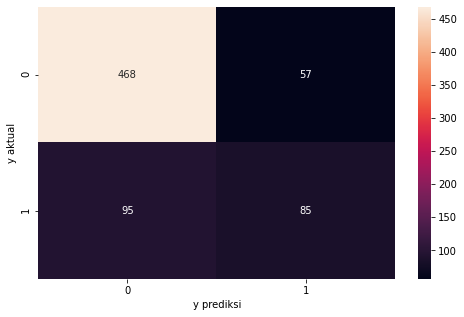

In [969]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yRF_test,y_predRF),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [970]:
print(classification_report(yRF_test,y_predRF))

precision    recall  f1-score   support

           0       0.83      0.89      0.86       525
           1       0.60      0.47      0.53       180

    accuracy                           0.78       705
   macro avg       0.71      0.68      0.69       705
weighted avg       0.77      0.78      0.78       705



In [971]:
pd.DataFrame(data= [accuracy_score(yRF_test,y_predRF)*100,recall_score(yRF_test,y_predRF)*100,precision_score(yRF_test,y_predRF)*100,roc_auc_score(yRF_test,y_predRF)*100,f1_score(yRF_test,y_predRF)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,78.439716
recall,47.222222
precission,59.859155
roc_auc_score,68.182540
F1 Score,52.795031


### Random Forest All Feature No Scalling No tuning Train 80

In [972]:
modelRF1 = RandomForestClassifier()
modelRF1.fit(xRF1_train, yRF1_train)

RandomForestClassifier()

In [973]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelRF1, xRF1_train, yRF1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.80319149 0.82446809 0.82446809 0.80141844 0.77797513 0.79218472
 0.78152753 0.77797513 0.80106572 0.77975133]


0.7964025673003037

In [974]:
y_predRF1 = modelRF1.predict(xRF1_test)

In [975]:
confusion_matrix(yRF1_test,y_predRF1)

array([[921, 120],
       [198, 170]])

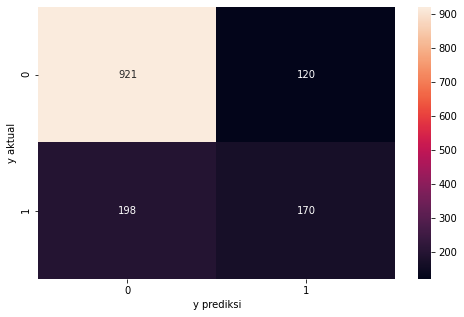

In [976]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yRF1_test,y_predRF1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [977]:
print(classification_report(yRF1_test,y_predRF1))

precision    recall  f1-score   support

           0       0.82      0.88      0.85      1041
           1       0.59      0.46      0.52       368

    accuracy                           0.77      1409
   macro avg       0.70      0.67      0.68      1409
weighted avg       0.76      0.77      0.77      1409



In [978]:
pd.DataFrame(data= [accuracy_score(yRF1_test,y_predRF1)*100,recall_score(yRF1_test,y_predRF1)*100,precision_score(yRF1_test,y_predRF1)*100,roc_auc_score(yRF1_test,y_predRF1)*100,f1_score(yRF1_test,y_predRF1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,77.430802
recall,46.195652
precission,58.620690
roc_auc_score,67.334137
F1 Score,51.671733


### Random Forest All Feature No Scalling with tuning RS Train 90

In [979]:
# parameter model Random Fores yang akan dituned + nilai yang mungkin

# max_depth= [10,20,30,40,50,60,70,80,90,100]
# min_samples_leaf = [1,2,4]
# min_samples_split = [2,5,10]
# n_estimators = [200,400,800,1000,1200,1400,1800,2000]


In [980]:
# param = {"max_depth":max_depth,"min_samples_leaf":min_samples_leaf,"min_samples_split":min_samples_split,"n_estimators":n_estimators}
# param

In [981]:
# model_RF = RandomForestClassifier()
# model_RF_RS = RandomizedSearchCV(estimator=model_RF,param_distributions= param,cv=5)


In [982]:
# model_RF_RS.fit(xRF_train,yRF_train)
# model_RF_RS.best_params_

In [983]:
modelRFRS = RandomForestClassifier(max_depth=10,min_samples_split=10,min_samples_leaf=1,n_estimators=1200)
modelRFRS.fit(xRF_train, yRF_train)

RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=1200)

In [984]:
y_predRFRS = modelRFRS.predict(xRF_test)

In [985]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelRFRS, xRF_train, yRF_train, cv=10)
print(clf_score)
clf_score.mean()

[0.78548896 0.8044164  0.82334385 0.80126183 0.80126183 0.82492114
 0.79022082 0.79179811 0.78199052 0.81990521]


0.80246086683511

In [986]:
confusion_matrix(yRF_test,y_predRFRS)

array([[470,  55],
       [ 94,  86]])

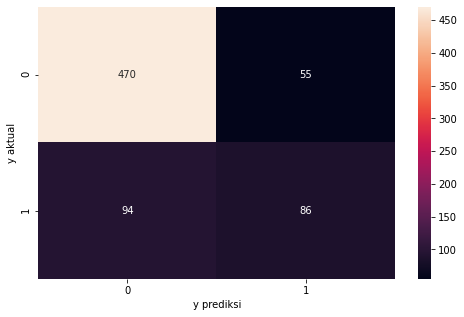

In [987]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yRF_test,y_predRFRS),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [988]:
print(classification_report(yRF_test,y_predRFRS))

precision    recall  f1-score   support

           0       0.83      0.90      0.86       525
           1       0.61      0.48      0.54       180

    accuracy                           0.79       705
   macro avg       0.72      0.69      0.70       705
weighted avg       0.78      0.79      0.78       705



In [989]:
pd.DataFrame(data= [accuracy_score(yRF_test,y_predRFRS)*100,recall_score(yRF_test,y_predRFRS)*100,precision_score(yRF_test,y_predRFRS)*100,roc_auc_score(yRF_test,y_predRFRS)*100,f1_score(yRF_test,y_predRFRS)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,78.865248
recall,47.777778
precission,60.992908
roc_auc_score,68.650794
F1 Score,53.582555


### Random Forest All Feature No Scalling with tuning RS Train 80

In [990]:
modelRFRS1 = RandomForestClassifier(max_depth=10,min_samples_split=10,min_samples_leaf=1,n_estimators=1200)
modelRFRS1.fit(xRF1_train, yRF1_train)

RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=1200)

In [991]:
y_predRFRS1 = modelRFRS1.predict(xRF1_test)

In [992]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelRFRS1, xRF1_train, yRF1_train, cv=10)
print(clf_score)
clf_score.mean()

[0.80851064 0.82092199 0.79609929 0.81028369 0.80461812 0.80994671
 0.79040853 0.78685613 0.80106572 0.81705151]


0.8045762316868851

In [993]:
confusion_matrix(yRF1_test,y_predRFRS1)

array([[934, 107],
       [188, 180]])

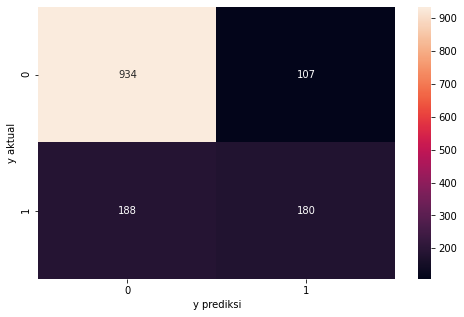

In [994]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yRF1_test,y_predRFRS1),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [995]:
print(classification_report(yRF1_test,y_predRFRS1))

precision    recall  f1-score   support

           0       0.83      0.90      0.86      1041
           1       0.63      0.49      0.55       368

    accuracy                           0.79      1409
   macro avg       0.73      0.69      0.71      1409
weighted avg       0.78      0.79      0.78      1409



In [996]:
pd.DataFrame(data= [accuracy_score(yRF1_test,y_predRFRS1)*100,recall_score(yRF1_test,y_predRFRS1)*100,precision_score(yRF1_test,y_predRFRS1)*100,roc_auc_score(yRF1_test,y_predRFRS1)*100,f1_score(yRF1_test,y_predRFRS1)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,79.063165
recall,48.913043
precission,62.717770
roc_auc_score,69.317233
F1 Score,54.961832


### Random Forest All Feature No Scalling with tuning GS Train 90

In [997]:
# modelRF = RandomForestClassifier()
# modelRFGS = GridSearchCV(modelRF, param_grid= param, cv = 5)

In [998]:
# modelRFGS.fit(xRF_train,yRF_train)
# modelRFGS.best_params_

In [999]:
modelRFGS = RandomForestClassifier(max_depth=20,min_samples_split=10,min_samples_leaf=1,n_estimators=800)
modelRFGS.fit(xRF_train, yRF_train)

RandomForestClassifier(max_depth=20, min_samples_split=10, n_estimators=800)

In [1000]:
y_predRFGS = modelRFGS.predict(xRF_test)

In [1001]:
# 10 Folds Cross Validation 
clf_score = cross_val_score(modelRFGS, xRF_train, yRF_train, cv=10)
print(clf_score)
clf_score.mean()

[0.78233438 0.79810726 0.82649842 0.79968454 0.79179811 0.81388013
 0.7807571  0.77917981 0.79146919 0.80094787]


0.7964656809245445

In [1002]:
confusion_matrix(yRF_test,y_predRFGS)

array([[469,  56],
       [ 91,  89]])

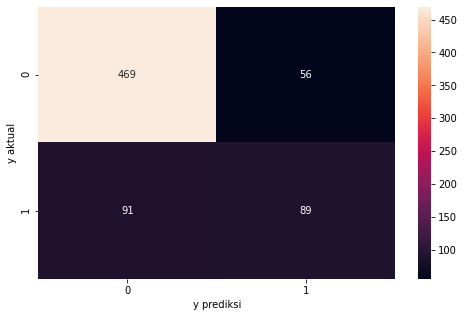

In [1003]:
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(yRF_test,y_predRFGS),annot=True,fmt=".0f",ax=ax)
plt.xlabel("y prediksi")
plt.ylabel("y aktual")
plt.show()

In [1004]:
print(classification_report(yRF_test,y_predRFGS))

precision    recall  f1-score   support

           0       0.84      0.89      0.86       525
           1       0.61      0.49      0.55       180

    accuracy                           0.79       705
   macro avg       0.73      0.69      0.71       705
weighted avg       0.78      0.79      0.78       705



In [1005]:
pd.DataFrame(data= [accuracy_score(yRF_test,y_predRFGS)*100,recall_score(yRF_test,y_predRFGS)*100,precision_score(yRF_test,y_predRFGS)*100,roc_auc_score(yRF_test,y_predRFGS)*100,f1_score(yRF_test,y_predRFGS)*100],
             index=["accuracy","recall","precission","roc_auc_score","F1 Score"],
             columns=["Score (%)"]
)

,Score (%)
accuracy,79.148936
recall,49.444444
precission,61.379310
roc_auc_score,69.388889
F1 Score,54.769231
